## A Generate the data

Create a 2-dimensional dataset consisting of two Gaussians centered at different points and with different covariances

In [69]:
import numpy as np
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(0)
torch.manual_seed(0)

# Generate dataset
num_train_samples = 1000
num_test_samples = 256

# Class 0: Gaussian centered at (6, 0)
mean0 = [6, 0]
cov0 = [[2, -1], [-1, 2]]

data0_train = np.random.multivariate_normal(mean0, cov0, num_train_samples)
labels0_train = np.zeros(num_train_samples)

data0_test = np.random.multivariate_normal(mean0, cov0, num_test_samples)
labels0_test = np.zeros(num_test_samples)

# Class 1: Gaussian centered at (-1, -1)
mean1 = [-1, -1]
cov1 = [[2, -1], [-1, 2]]

data1_train = np.random.multivariate_normal(mean1, cov1, num_train_samples)
labels1_train = np.ones(num_train_samples)

data1_test = np.random.multivariate_normal(mean1, cov1, num_test_samples)
labels1_test = np.ones(num_test_samples)

# Class 2: Gaussian centered at (4, 6)
mean2 = [4, 6]
cov2 = [[2, -1], [-1, 1]]

data2_train = np.random.multivariate_normal(mean2, cov2, num_train_samples)
labels2_train = 2*np.ones(num_train_samples)

data2_test = np.random.multivariate_normal(mean2, cov2, num_test_samples)
labels2_test = 2*np.ones(num_test_samples)

# Class 3: Gaussian centered at (-2, 6)
mean3 = [-2, 6]
cov3 = [[1, 0], [0, 1]]

data3_train = np.random.multivariate_normal(mean3, cov3, num_train_samples)
labels3_train = 3*np.ones(num_train_samples)

data3_test = np.random.multivariate_normal(mean3, cov3, num_test_samples)
labels3_test = 3*np.ones(num_test_samples)

# Combine data
data_train = np.vstack((data0_train, data1_train, data2_train, data3_train))
labels_train = np.hstack((labels0_train, labels1_train, labels2_train, labels3_train))

data_test = np.vstack((data0_test, data1_test, data2_test, data3_test))
labels_test = np.hstack((labels0_test, labels1_test, labels2_test, labels3_test))

# Convert to PyTorch tensors
data_train_tensor = torch.tensor(data_train, dtype=torch.float32)
labels_train_tensor = torch.tensor(labels_train, dtype=torch.long)

data_test_tensor = torch.tensor(data_test, dtype=torch.float32)
labels_test_tensor = torch.tensor(labels_test, dtype=torch.long)

# Create DataLoader - will be used later for training the NN
dataset_train = TensorDataset(data_train_tensor, labels_train_tensor)
dataloader_train = DataLoader(dataset_train, batch_size=32, shuffle=True) # Mini-batch = 32

dataset_test = TensorDataset(data_test_tensor, labels_test_tensor)
dataloader_test = DataLoader(dataset_test, batch_size=32, shuffle=True) # Mini-batch = 32

In [70]:
labels_train.shape

(4000,)

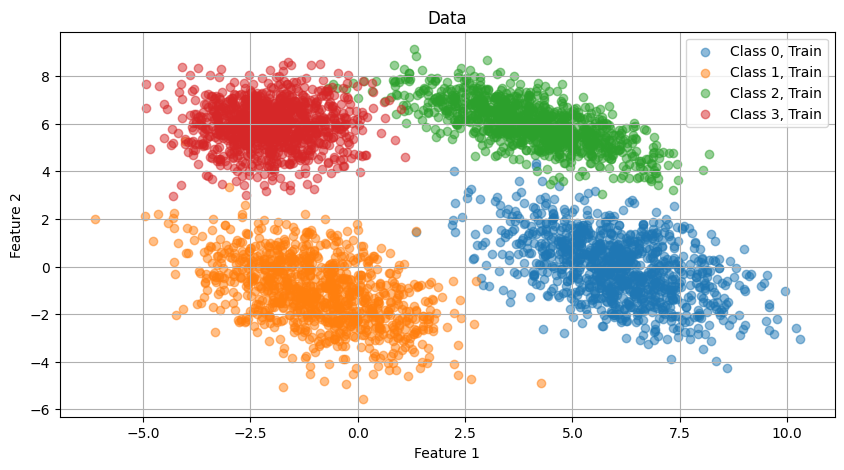

In [71]:
## Plot the data

plt.figure(figsize=(10, 5))
plt.scatter(data_train[labels_train == 0, 0], data_train[labels_train == 0, 1], label='Class 0, Train', alpha=0.5)
plt.scatter(data_train[labels_train == 1, 0], data_train[labels_train == 1, 1], label='Class 1, Train', alpha=0.5)
plt.scatter(data_train[labels_train == 2, 0], data_train[labels_train == 2, 1], label='Class 2, Train', alpha=0.5)
plt.scatter(data_train[labels_train == 3, 0], data_train[labels_train == 3, 1], label='Class 3, Train', alpha=0.5)

plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Data')
plt.legend()
plt.grid(True)
plt.show()

## C Model Training

Define a simple neural network and train it using a gradient-based optimizer

In [72]:
class SimpleNN(nn.Module):
    # Define a simple 3-layer NN of hidden width m=16
    def __init__(self):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(2, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, 4)

    def forward(self, x):
        x = torch.relu(self.fc1(x)) # use ReLU activation functions
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

    def cone_activ(self, x):
        return 1 - torch.abs(1-x)

In [73]:
# Initialize the neural network, loss function, and optimizer
model = SimpleNN()
criterion = nn.CrossEntropyLoss() # Use cross-entropy loss

optimizer = optim.Adam(model.parameters(), lr=0.001) # Use Adam optimizer --> one can use different optimizers too

losses = []
losses_test = []
num_epochs = 10 # Define number of epochs to train
for epoch in range(num_epochs):
    for inputs, targets in dataloader_train: # the dataloader defines size of mini-batch (here 32)
        # Zero the parameter gradients
        optimizer.zero_grad()
        # Forward pass
        outputs = model(inputs) # model prediction of the outputs
        loss = criterion(outputs, targets) # calculate the loss over the mini-batch
        # Backward pass and optimization
        loss.backward() # the infamous backpropagation
        optimizer.step() # update the parameters in your model based on backpropaged gradients, i.e. x_k+1 = x_k - eta * grad f(x_k)
        # Record the loss
        losses.append(loss.item())

        with torch.no_grad():
            loss_test = 0
            for inputs_test, targets_test in dataloader_test:
                outputs_test = model(inputs_test)
                loss_test += criterion(outputs_test, targets_test)
            losses_test.append(loss_test)

    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}, Test Loss: {loss_test/8:.4f}')
print('Training complete.')

Epoch 1/10, Loss: 0.0894, Test Loss: 0.3117
Epoch 2/10, Loss: 0.0261, Test Loss: 0.2112
Epoch 3/10, Loss: 0.0371, Test Loss: 0.1918
Epoch 4/10, Loss: 0.0404, Test Loss: 0.1764
Epoch 5/10, Loss: 0.1579, Test Loss: 0.2176
Epoch 6/10, Loss: 0.0042, Test Loss: 0.1402
Epoch 7/10, Loss: 0.0129, Test Loss: 0.1313
Epoch 8/10, Loss: 0.0049, Test Loss: 0.1149
Epoch 9/10, Loss: 0.0229, Test Loss: 0.1108
Epoch 10/10, Loss: 0.0225, Test Loss: 0.1187
Training complete.


Things to play around with:
- change the **Network architecture**
  - by increasing the number of layers
  - by increasing the width of the hidden layers
  - also try out different activation functions. (Check out a list of possible choice here under "non-linear activation functions" https://pytorch.org/docs/stable/nn.functional.html or here: https://arxiv.org/pdf/2405.04459)

  What do you observe with respect to the training time? And with respect to the loss curve? What about the decision boundary?

  - Use ```sum([len(param.flatten()) for param in model.parameters()]) ``` to calculate the total number of parameters. If a network has similar number of parameters, is it better to have more layers or wider layers?

- play around with the **learning rate**. How large can you choose it before your loss diverges? Do you observe any connection with the size of your network architecture?
  - Replace Adam by the SGD optimizer (https://pytorch.org/docs/stable/generated/torch.optim.SGD.html#torch.optim.SGD). Does your loss curve look any different?


## D Plot the loss

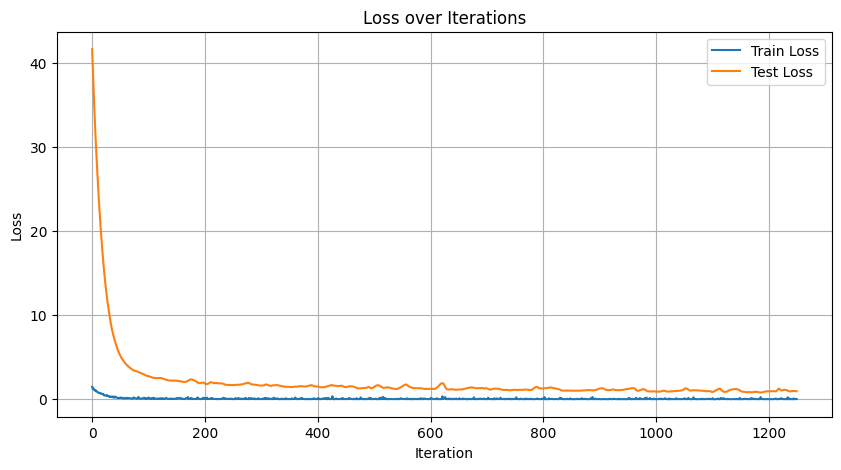

In [74]:
# Plot the loss over iterations
plt.figure(figsize=(10, 5))
plt.plot(losses, label='Train Loss')
plt.plot(losses_test, label='Test Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Loss over Iterations')
plt.legend()
plt.grid(True)
plt.show()

## E Plot the decision boundary

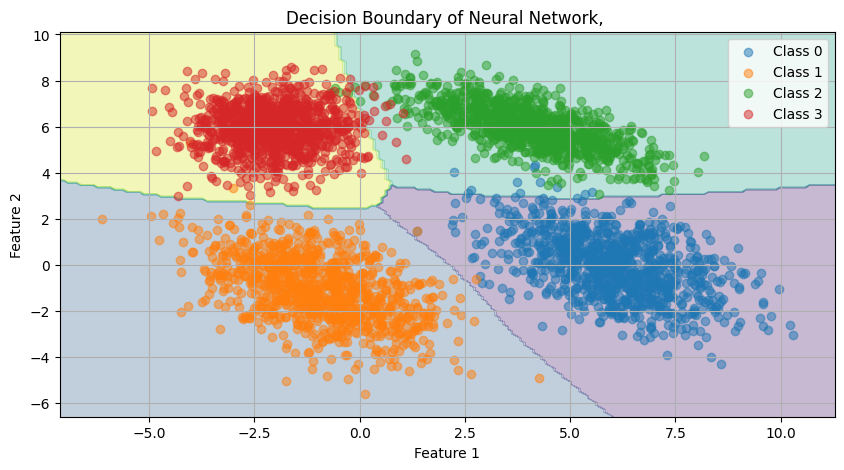

In [75]:
# Plot decision boundary
def plot_decision_boundary(model, data, labels, title_info=''):
    x_min, x_max = data[:, 0].min() - 1, data[:, 0].max() + 1
    y_min, y_max = data[:, 1].min() - 1, data[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))

    grid = np.c_[xx.ravel(), yy.ravel()]
    grid_tensor = torch.tensor(grid, dtype=torch.float32)
    with torch.no_grad():
        predictions = model(grid_tensor)
    Z = predictions.argmax(dim=1).reshape(xx.shape)

    plt.figure(figsize=(10, 5))

    plt.contourf(xx, yy, Z, alpha=0.3)
    
    for i in range(len(labels_train_tensor.unique())):
        plt.scatter(data[labels == i, 0], data[labels == i, 1], label=f'Class {i}', alpha=0.5)

    # plt.scatter(data_test[labels_test == 0, 0], data_test[labels_test == 0, 1], label='Class 0, Test', alpha=0.5)
    # plt.scatter(data_test[labels_test == 1, 0], data_test[labels_test == 1, 1], label='Class 1, Test', alpha=0.5)

    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title(f'Decision Boundary of Neural Network, {title_info}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Call the function to plot the decision boundary
plot_decision_boundary(model, data_train_tensor, labels_train_tensor, title_info='')

## F Exploring different network architectures

In [76]:
class SimpleNN2(nn.Module):
    # Define a simple 3-layer NN of hidden width m=16
    def __init__(self, num_classes, activ, num_layer, hidden_width):
        super(SimpleNN2, self).__init__()
        self.fc1 = nn.Linear(2, hidden_width)
        self.fc2 = nn.Linear(hidden_width, hidden_width)
        self.fc3 = nn.Linear(hidden_width, num_classes)
        
        if activ == 'relu':
            self.activ = torch.relu
        elif activ == 'tanh':
            self.activ = torch.tanh
        elif activ == 'cone':
            self.activ = self.cone_activ
        elif activ == 'gelu':
            self.activ = torch.nn.functional.gelu
        elif activ == 'elu':
            self.activ = torch.nn.functional.elu
        else:
            raise ValueError('Unknown activation function specified')
            
        self.hidden_width = hidden_width 
        
        assert num_layer >= 2, ValueError('Network must have at least 2 layers!')
        self.num_layer = num_layer

    def forward(self, x):
        x = self.activ(self.fc1(x)) 
        if self.num_layer > 2:
            for _ in range(self.num_layer-2):
                x = self.activ(self.fc2(x))
        
        x = self.fc3(x)
        return x

    def cone_activ(self, x):
        return 1 - torch.abs(1-x)
    
    def identity(self, x):
        return x

Epoch 1/10, Loss: 0.6915
Epoch 2/10, Loss: 0.3133
Epoch 3/10, Loss: 0.1895
Epoch 4/10, Loss: 0.2318
Epoch 5/10, Loss: 0.1352
Epoch 6/10, Loss: 0.1859
Epoch 7/10, Loss: 0.0702
Epoch 8/10, Loss: 0.0999
Epoch 9/10, Loss: 0.1132
Epoch 10/10, Loss: 0.0744
Training complete.
Epoch 1/10, Loss: 0.3751
Epoch 2/10, Loss: 0.0989
Epoch 3/10, Loss: 0.0367
Epoch 4/10, Loss: 0.0294
Epoch 5/10, Loss: 0.0248
Epoch 6/10, Loss: 0.0690
Epoch 7/10, Loss: 0.0174
Epoch 8/10, Loss: 0.2359
Epoch 9/10, Loss: 0.0736
Epoch 10/10, Loss: 0.1410
Training complete.
Epoch 1/10, Loss: 0.2846
Epoch 2/10, Loss: 0.0343
Epoch 3/10, Loss: 0.0900
Epoch 4/10, Loss: 0.0184
Epoch 5/10, Loss: 0.1239
Epoch 6/10, Loss: 0.0734
Epoch 7/10, Loss: 0.0369
Epoch 8/10, Loss: 0.0563
Epoch 9/10, Loss: 0.0495
Epoch 10/10, Loss: 0.0113
Training complete.
Epoch 1/10, Loss: 0.2308
Epoch 2/10, Loss: 0.1866
Epoch 3/10, Loss: 0.1936
Epoch 4/10, Loss: 0.0205
Epoch 5/10, Loss: 0.0050
Epoch 6/10, Loss: 0.0186
Epoch 7/10, Loss: 0.0142
Epoch 8/10, Los

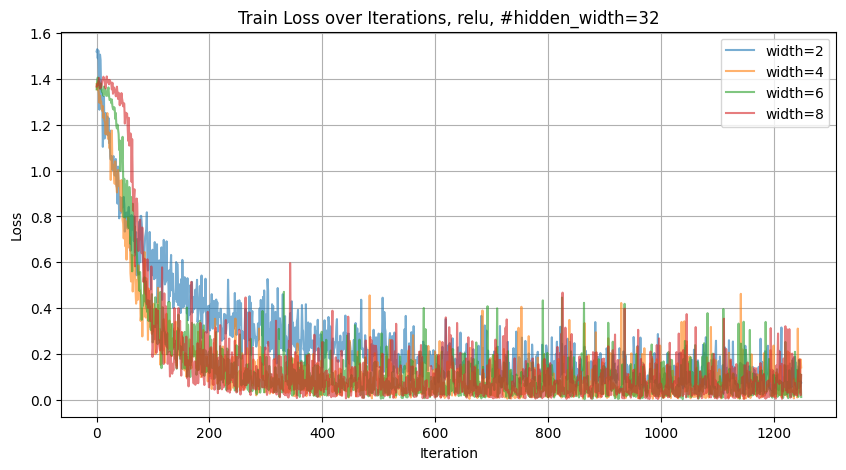

Epoch 1/10, Loss: 0.3007
Epoch 2/10, Loss: 0.2085
Epoch 3/10, Loss: 0.1675
Epoch 4/10, Loss: 0.2179
Epoch 5/10, Loss: 0.0714
Epoch 6/10, Loss: 0.0871
Epoch 7/10, Loss: 0.0749
Epoch 8/10, Loss: 0.0826
Epoch 9/10, Loss: 0.0910
Epoch 10/10, Loss: 0.0315
Training complete.
Epoch 1/10, Loss: 0.1127
Epoch 2/10, Loss: 0.1461
Epoch 3/10, Loss: 0.0825
Epoch 4/10, Loss: 0.1255
Epoch 5/10, Loss: 0.0810
Epoch 6/10, Loss: 0.0219
Epoch 7/10, Loss: 0.0169
Epoch 8/10, Loss: 0.1070
Epoch 9/10, Loss: 0.0821
Epoch 10/10, Loss: 0.1058
Training complete.
Epoch 1/10, Loss: 0.1035
Epoch 2/10, Loss: 0.1714
Epoch 3/10, Loss: 0.2137
Epoch 4/10, Loss: 0.0199
Epoch 5/10, Loss: 0.1661
Epoch 6/10, Loss: 0.0097
Epoch 7/10, Loss: 0.0046
Epoch 8/10, Loss: 0.0056
Epoch 9/10, Loss: 0.0323
Epoch 10/10, Loss: 0.0756
Training complete.
Epoch 1/10, Loss: 0.1982
Epoch 2/10, Loss: 0.0753
Epoch 3/10, Loss: 0.1402
Epoch 4/10, Loss: 0.1365
Epoch 5/10, Loss: 0.0707
Epoch 6/10, Loss: 0.0781
Epoch 7/10, Loss: 0.0372
Epoch 8/10, Los

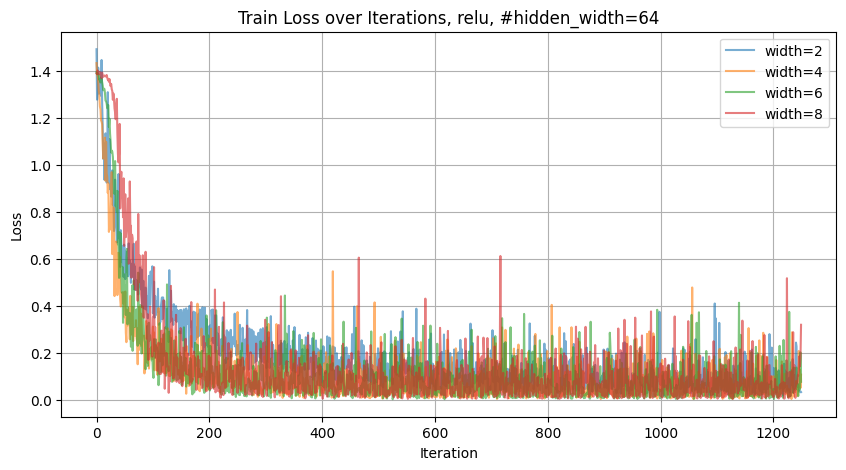

Epoch 1/10, Loss: 0.3632
Epoch 2/10, Loss: 0.1712
Epoch 3/10, Loss: 0.1030
Epoch 4/10, Loss: 0.0476
Epoch 5/10, Loss: 0.1388
Epoch 6/10, Loss: 0.0607
Epoch 7/10, Loss: 0.1547
Epoch 8/10, Loss: 0.1517
Epoch 9/10, Loss: 0.1435
Epoch 10/10, Loss: 0.1202
Training complete.
Epoch 1/10, Loss: 0.0881
Epoch 2/10, Loss: 0.1395
Epoch 3/10, Loss: 0.0142
Epoch 4/10, Loss: 0.0342
Epoch 5/10, Loss: 0.0763
Epoch 6/10, Loss: 0.0397
Epoch 7/10, Loss: 0.0183
Epoch 8/10, Loss: 0.3212
Epoch 9/10, Loss: 0.0843
Epoch 10/10, Loss: 0.0134
Training complete.
Epoch 1/10, Loss: 0.0842
Epoch 2/10, Loss: 0.0327
Epoch 3/10, Loss: 0.0323
Epoch 4/10, Loss: 0.1740
Epoch 5/10, Loss: 0.3459
Epoch 6/10, Loss: 0.0812
Epoch 7/10, Loss: 0.0124
Epoch 8/10, Loss: 0.0142
Epoch 9/10, Loss: 0.1528
Epoch 10/10, Loss: 0.3001
Training complete.
Epoch 1/10, Loss: 0.0377
Epoch 2/10, Loss: 0.1133
Epoch 3/10, Loss: 0.0313
Epoch 4/10, Loss: 0.0084
Epoch 5/10, Loss: 0.0113
Epoch 6/10, Loss: 0.0456
Epoch 7/10, Loss: 0.0328
Epoch 8/10, Los

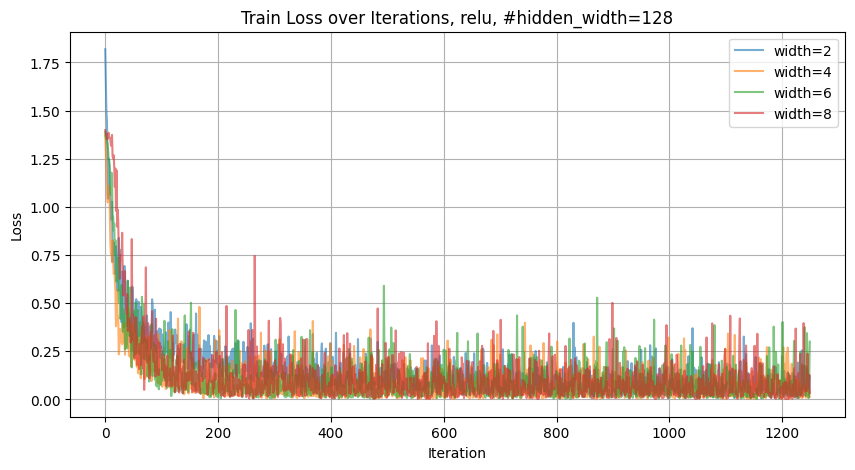

Epoch 1/10, Loss: 0.1146
Epoch 2/10, Loss: 0.1164
Epoch 3/10, Loss: 0.1167
Epoch 4/10, Loss: 0.0646
Epoch 5/10, Loss: 0.2463
Epoch 6/10, Loss: 0.1257
Epoch 7/10, Loss: 0.0167
Epoch 8/10, Loss: 0.0920
Epoch 9/10, Loss: 0.0722
Epoch 10/10, Loss: 0.0376
Training complete.
Epoch 1/10, Loss: 0.1738
Epoch 2/10, Loss: 0.1877
Epoch 3/10, Loss: 0.0892
Epoch 4/10, Loss: 0.0319
Epoch 5/10, Loss: 0.0839
Epoch 6/10, Loss: 0.0901
Epoch 7/10, Loss: 0.0447
Epoch 8/10, Loss: 0.0380
Epoch 9/10, Loss: 0.3555
Epoch 10/10, Loss: 0.0562
Training complete.
Epoch 1/10, Loss: 0.0294
Epoch 2/10, Loss: 0.0593
Epoch 3/10, Loss: 0.1100
Epoch 4/10, Loss: 0.0174
Epoch 5/10, Loss: 0.0089
Epoch 6/10, Loss: 0.1141
Epoch 7/10, Loss: 0.1427
Epoch 8/10, Loss: 0.0731
Epoch 9/10, Loss: 0.1149
Epoch 10/10, Loss: 0.0634
Training complete.
Epoch 1/10, Loss: 0.1628
Epoch 2/10, Loss: 0.0696
Epoch 3/10, Loss: 0.0336
Epoch 4/10, Loss: 0.1202
Epoch 5/10, Loss: 0.0314
Epoch 6/10, Loss: 0.1177
Epoch 7/10, Loss: 0.0210
Epoch 8/10, Los

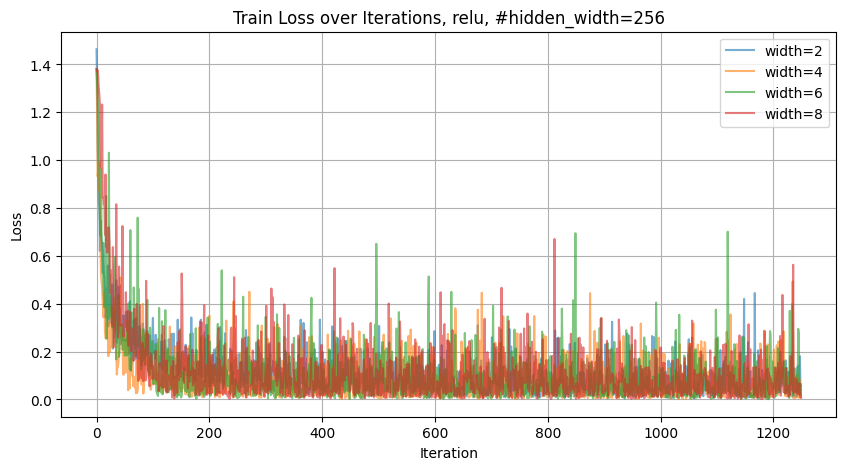

Epoch 1/10, Loss: 0.6164
Epoch 2/10, Loss: 0.2900
Epoch 3/10, Loss: 0.2403
Epoch 4/10, Loss: 0.1353
Epoch 5/10, Loss: 0.1456
Epoch 6/10, Loss: 0.2111
Epoch 7/10, Loss: 0.0572
Epoch 8/10, Loss: 0.0933
Epoch 9/10, Loss: 0.1128
Epoch 10/10, Loss: 0.1236
Training complete.
Epoch 1/10, Loss: 0.2534
Epoch 2/10, Loss: 0.0868
Epoch 3/10, Loss: 0.0377
Epoch 4/10, Loss: 0.0428
Epoch 5/10, Loss: 0.0254
Epoch 6/10, Loss: 0.2410
Epoch 7/10, Loss: 0.1771
Epoch 8/10, Loss: 0.0269
Epoch 9/10, Loss: 0.0189
Epoch 10/10, Loss: 0.0731
Training complete.
Epoch 1/10, Loss: 0.1402
Epoch 2/10, Loss: 0.0493
Epoch 3/10, Loss: 0.0730
Epoch 4/10, Loss: 0.0607
Epoch 5/10, Loss: 0.1079
Epoch 6/10, Loss: 0.0457
Epoch 7/10, Loss: 0.0084
Epoch 8/10, Loss: 0.0098
Epoch 9/10, Loss: 0.2592
Epoch 10/10, Loss: 0.1751
Training complete.
Epoch 1/10, Loss: 0.4167
Epoch 2/10, Loss: 0.1075
Epoch 3/10, Loss: 0.1706
Epoch 4/10, Loss: 0.1826
Epoch 5/10, Loss: 0.2662
Epoch 6/10, Loss: 0.0111
Epoch 7/10, Loss: 0.0248
Epoch 8/10, Los

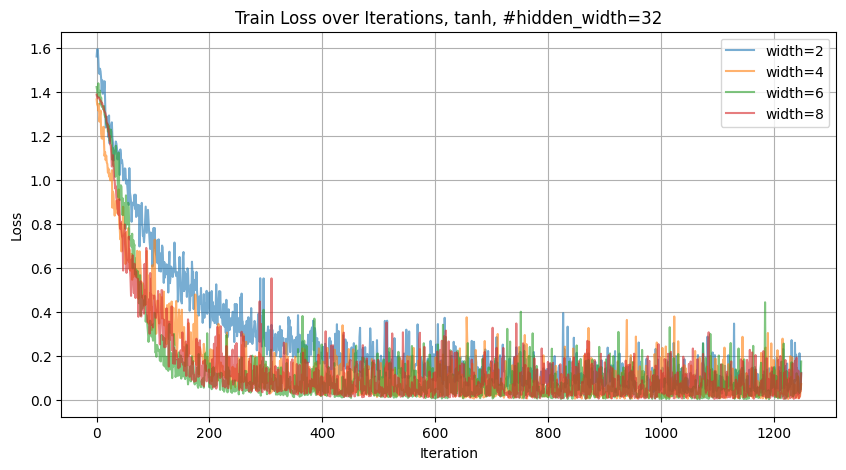

Epoch 1/10, Loss: 0.4801
Epoch 2/10, Loss: 0.2483
Epoch 3/10, Loss: 0.1256
Epoch 4/10, Loss: 0.0970
Epoch 5/10, Loss: 0.0792
Epoch 6/10, Loss: 0.1330
Epoch 7/10, Loss: 0.0902
Epoch 8/10, Loss: 0.0749
Epoch 9/10, Loss: 0.0316
Epoch 10/10, Loss: 0.0267
Training complete.
Epoch 1/10, Loss: 0.1711
Epoch 2/10, Loss: 0.0199
Epoch 3/10, Loss: 0.0680
Epoch 4/10, Loss: 0.0114
Epoch 5/10, Loss: 0.0310
Epoch 6/10, Loss: 0.0111
Epoch 7/10, Loss: 0.0113
Epoch 8/10, Loss: 0.0157
Epoch 9/10, Loss: 0.0420
Epoch 10/10, Loss: 0.1465
Training complete.
Epoch 1/10, Loss: 0.0624
Epoch 2/10, Loss: 0.0435
Epoch 3/10, Loss: 0.1728
Epoch 4/10, Loss: 0.0112
Epoch 5/10, Loss: 0.0076
Epoch 6/10, Loss: 0.0557
Epoch 7/10, Loss: 0.0102
Epoch 8/10, Loss: 0.0308
Epoch 9/10, Loss: 0.0360
Epoch 10/10, Loss: 0.0353
Training complete.
Epoch 1/10, Loss: 0.1568
Epoch 2/10, Loss: 0.1394
Epoch 3/10, Loss: 0.0474
Epoch 4/10, Loss: 0.0336
Epoch 5/10, Loss: 0.0103
Epoch 6/10, Loss: 0.0736
Epoch 7/10, Loss: 0.0101
Epoch 8/10, Los

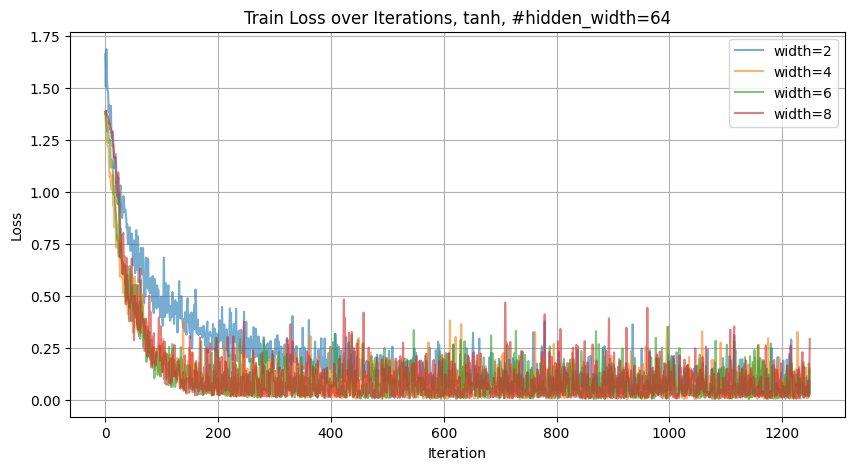

Epoch 1/10, Loss: 0.2503
Epoch 2/10, Loss: 0.1177
Epoch 3/10, Loss: 0.0591
Epoch 4/10, Loss: 0.1437
Epoch 5/10, Loss: 0.1068
Epoch 6/10, Loss: 0.0507
Epoch 7/10, Loss: 0.0244
Epoch 8/10, Loss: 0.0902
Epoch 9/10, Loss: 0.0286
Epoch 10/10, Loss: 0.0797
Training complete.
Epoch 1/10, Loss: 0.1314
Epoch 2/10, Loss: 0.0158
Epoch 3/10, Loss: 0.0553
Epoch 4/10, Loss: 0.0401
Epoch 5/10, Loss: 0.0380
Epoch 6/10, Loss: 0.0052
Epoch 7/10, Loss: 0.0181
Epoch 8/10, Loss: 0.0937
Epoch 9/10, Loss: 0.0698
Epoch 10/10, Loss: 0.1931
Training complete.
Epoch 1/10, Loss: 0.0839
Epoch 2/10, Loss: 0.0496
Epoch 3/10, Loss: 0.3034
Epoch 4/10, Loss: 0.4241
Epoch 5/10, Loss: 0.1690
Epoch 6/10, Loss: 0.0217
Epoch 7/10, Loss: 0.0296
Epoch 8/10, Loss: 0.0054
Epoch 9/10, Loss: 0.0987
Epoch 10/10, Loss: 0.0254
Training complete.
Epoch 1/10, Loss: 0.0186
Epoch 2/10, Loss: 0.2967
Epoch 3/10, Loss: 0.0294
Epoch 4/10, Loss: 0.1142
Epoch 5/10, Loss: 0.0387
Epoch 6/10, Loss: 0.0083
Epoch 7/10, Loss: 0.1020
Epoch 8/10, Los

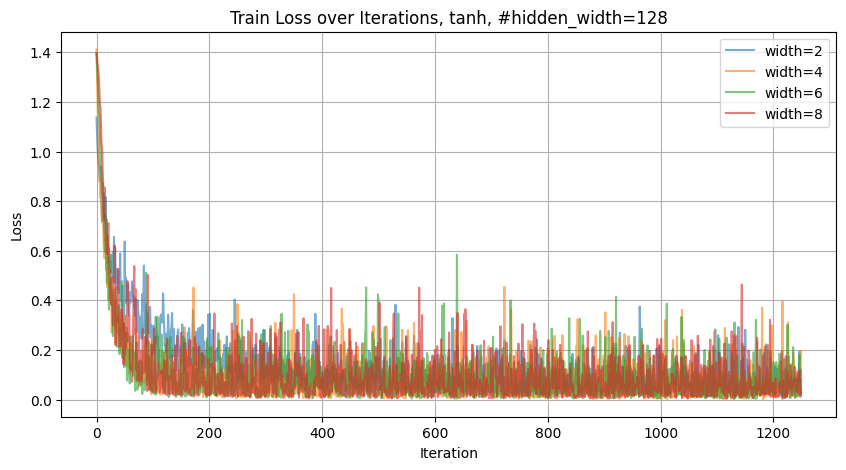

Epoch 1/10, Loss: 0.2286
Epoch 2/10, Loss: 0.0478
Epoch 3/10, Loss: 0.0821
Epoch 4/10, Loss: 0.0436
Epoch 5/10, Loss: 0.1155
Epoch 6/10, Loss: 0.0450
Epoch 7/10, Loss: 0.1266
Epoch 8/10, Loss: 0.0072
Epoch 9/10, Loss: 0.3168
Epoch 10/10, Loss: 0.0538
Training complete.
Epoch 1/10, Loss: 0.0283
Epoch 2/10, Loss: 0.2760
Epoch 3/10, Loss: 0.2007
Epoch 4/10, Loss: 0.0192
Epoch 5/10, Loss: 0.0287
Epoch 6/10, Loss: 0.1220
Epoch 7/10, Loss: 0.1104
Epoch 8/10, Loss: 0.1680
Epoch 9/10, Loss: 0.1149
Epoch 10/10, Loss: 0.0234
Training complete.
Epoch 1/10, Loss: 0.0772
Epoch 2/10, Loss: 0.1196
Epoch 3/10, Loss: 0.1744
Epoch 4/10, Loss: 0.0527
Epoch 5/10, Loss: 0.0030
Epoch 6/10, Loss: 0.0162
Epoch 7/10, Loss: 0.2051
Epoch 8/10, Loss: 0.0579
Epoch 9/10, Loss: 0.0632
Epoch 10/10, Loss: 0.0061
Training complete.
Epoch 1/10, Loss: 0.1341
Epoch 2/10, Loss: 0.1251
Epoch 3/10, Loss: 0.2405
Epoch 4/10, Loss: 0.4472
Epoch 5/10, Loss: 0.0128
Epoch 6/10, Loss: 0.1879
Epoch 7/10, Loss: 0.0127
Epoch 8/10, Los

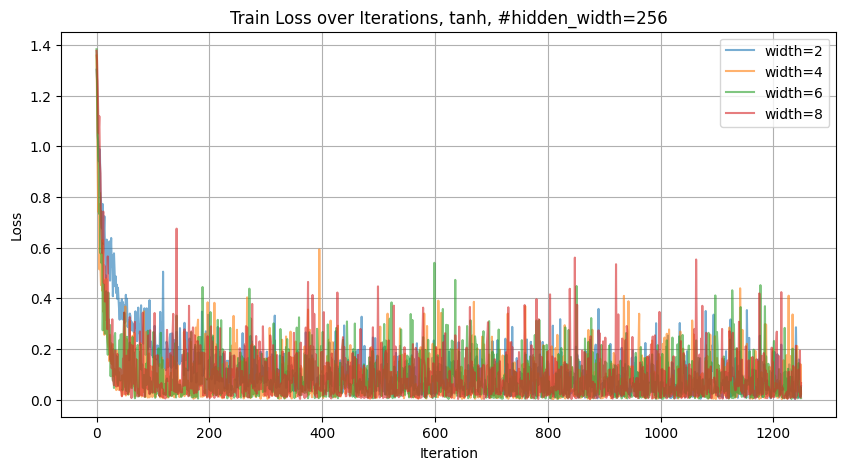

Epoch 1/10, Loss: 0.5611
Epoch 2/10, Loss: 0.2790
Epoch 3/10, Loss: 0.1977
Epoch 4/10, Loss: 0.1288
Epoch 5/10, Loss: 0.0963
Epoch 6/10, Loss: 0.0817
Epoch 7/10, Loss: 0.0966
Epoch 8/10, Loss: 0.0806
Epoch 9/10, Loss: 0.0564
Epoch 10/10, Loss: 0.1152
Training complete.
Epoch 1/10, Loss: 0.2051
Epoch 2/10, Loss: 0.1176
Epoch 3/10, Loss: 0.0219
Epoch 4/10, Loss: 0.1492
Epoch 5/10, Loss: 0.0078
Epoch 6/10, Loss: 0.0182
Epoch 7/10, Loss: 0.0859
Epoch 8/10, Loss: 0.0823
Epoch 9/10, Loss: 0.2736
Epoch 10/10, Loss: 0.0304
Training complete.
Epoch 1/10, Loss: 0.2326
Epoch 2/10, Loss: 0.0299
Epoch 3/10, Loss: 0.1957
Epoch 4/10, Loss: 0.0962
Epoch 5/10, Loss: 0.0969
Epoch 6/10, Loss: 0.0352
Epoch 7/10, Loss: 0.0294
Epoch 8/10, Loss: 0.0124
Epoch 9/10, Loss: 0.0253
Epoch 10/10, Loss: 0.0765
Training complete.
Epoch 1/10, Loss: 0.3748
Epoch 2/10, Loss: 0.1305
Epoch 3/10, Loss: 0.2495
Epoch 4/10, Loss: 0.1714
Epoch 5/10, Loss: 0.1662
Epoch 6/10, Loss: 0.0794
Epoch 7/10, Loss: 0.0847
Epoch 8/10, Los

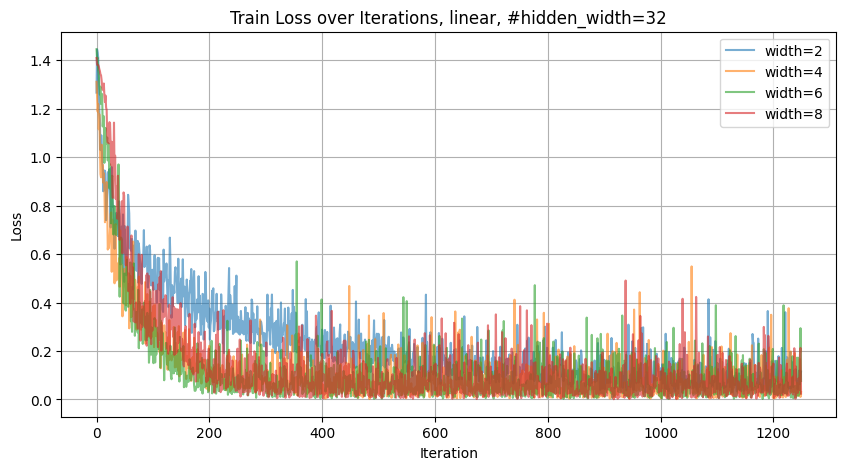

Epoch 1/10, Loss: 0.3088
Epoch 2/10, Loss: 0.3769
Epoch 3/10, Loss: 0.2189
Epoch 4/10, Loss: 0.2499
Epoch 5/10, Loss: 0.0926
Epoch 6/10, Loss: 0.0379
Epoch 7/10, Loss: 0.0291
Epoch 8/10, Loss: 0.0568
Epoch 9/10, Loss: 0.1364
Epoch 10/10, Loss: 0.0613
Training complete.
Epoch 1/10, Loss: 0.0575
Epoch 2/10, Loss: 0.1087
Epoch 3/10, Loss: 0.0508
Epoch 4/10, Loss: 0.0502
Epoch 5/10, Loss: 0.0127
Epoch 6/10, Loss: 0.0109
Epoch 7/10, Loss: 0.0963
Epoch 8/10, Loss: 0.0279
Epoch 9/10, Loss: 0.0422
Epoch 10/10, Loss: 0.2985
Training complete.
Epoch 1/10, Loss: 0.0311
Epoch 2/10, Loss: 0.0241
Epoch 3/10, Loss: 0.0198
Epoch 4/10, Loss: 0.0155
Epoch 5/10, Loss: 0.0552
Epoch 6/10, Loss: 0.1238
Epoch 7/10, Loss: 0.2092
Epoch 8/10, Loss: 0.0276
Epoch 9/10, Loss: 0.0109
Epoch 10/10, Loss: 0.0203
Training complete.
Epoch 1/10, Loss: 0.1249
Epoch 2/10, Loss: 0.0694
Epoch 3/10, Loss: 0.1527
Epoch 4/10, Loss: 0.0807
Epoch 5/10, Loss: 0.0094
Epoch 6/10, Loss: 0.1235
Epoch 7/10, Loss: 0.0222
Epoch 8/10, Los

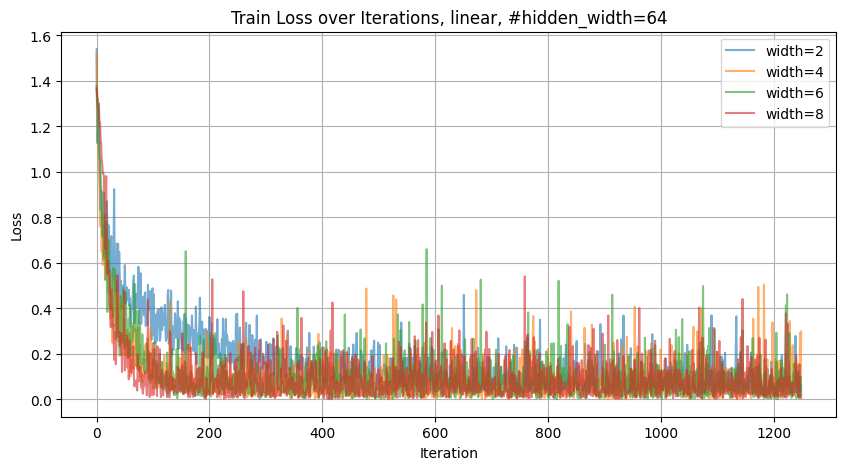

Epoch 1/10, Loss: 0.4337
Epoch 2/10, Loss: 0.2259
Epoch 3/10, Loss: 0.1430
Epoch 4/10, Loss: 0.1306
Epoch 5/10, Loss: 0.2062
Epoch 6/10, Loss: 0.0415
Epoch 7/10, Loss: 0.0294
Epoch 8/10, Loss: 0.1009
Epoch 9/10, Loss: 0.1093
Epoch 10/10, Loss: 0.0920
Training complete.
Epoch 1/10, Loss: 0.0651
Epoch 2/10, Loss: 0.0485
Epoch 3/10, Loss: 0.0868
Epoch 4/10, Loss: 0.1289
Epoch 5/10, Loss: 0.0516
Epoch 6/10, Loss: 0.0147
Epoch 7/10, Loss: 0.0167
Epoch 8/10, Loss: 0.0204
Epoch 9/10, Loss: 0.0258
Epoch 10/10, Loss: 0.1564
Training complete.
Epoch 1/10, Loss: 0.1000
Epoch 2/10, Loss: 0.0272
Epoch 3/10, Loss: 0.0979
Epoch 4/10, Loss: 0.1035
Epoch 5/10, Loss: 0.0212
Epoch 6/10, Loss: 0.1157
Epoch 7/10, Loss: 0.0384
Epoch 8/10, Loss: 0.1195
Epoch 9/10, Loss: 0.0120
Epoch 10/10, Loss: 0.0187
Training complete.
Epoch 1/10, Loss: 0.0244
Epoch 2/10, Loss: 0.0818
Epoch 3/10, Loss: 0.2303
Epoch 4/10, Loss: 0.0518
Epoch 5/10, Loss: 0.2839
Epoch 6/10, Loss: 0.0263
Epoch 7/10, Loss: 0.0795
Epoch 8/10, Los

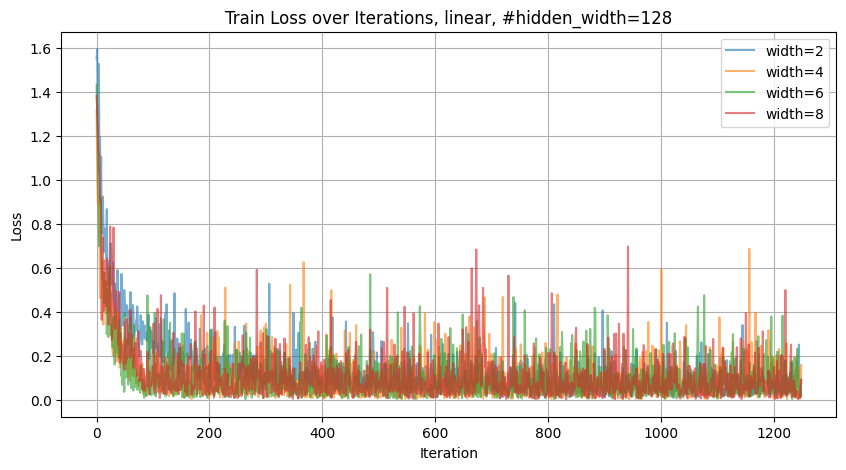

Epoch 1/10, Loss: 0.1475
Epoch 2/10, Loss: 0.2568
Epoch 3/10, Loss: 0.0462
Epoch 4/10, Loss: 0.0347
Epoch 5/10, Loss: 0.0616
Epoch 6/10, Loss: 0.0390
Epoch 7/10, Loss: 0.1719
Epoch 8/10, Loss: 0.0298
Epoch 9/10, Loss: 0.0227
Epoch 10/10, Loss: 0.0133
Training complete.
Epoch 1/10, Loss: 0.0612
Epoch 2/10, Loss: 0.5087
Epoch 3/10, Loss: 0.0043
Epoch 4/10, Loss: 0.1145
Epoch 5/10, Loss: 0.0755
Epoch 6/10, Loss: 0.0866
Epoch 7/10, Loss: 0.2109
Epoch 8/10, Loss: 0.1008
Epoch 9/10, Loss: 0.1497
Epoch 10/10, Loss: 0.2392
Training complete.
Epoch 1/10, Loss: 0.1092
Epoch 2/10, Loss: 0.0568
Epoch 3/10, Loss: 0.0090
Epoch 4/10, Loss: 0.0418
Epoch 5/10, Loss: 0.1402
Epoch 6/10, Loss: 0.2270
Epoch 7/10, Loss: 0.1146
Epoch 8/10, Loss: 0.0356
Epoch 9/10, Loss: 0.1417
Epoch 10/10, Loss: 0.0455
Training complete.
Epoch 1/10, Loss: 0.0744
Epoch 2/10, Loss: 0.0138
Epoch 3/10, Loss: 0.0230
Epoch 4/10, Loss: 0.0566
Epoch 5/10, Loss: 0.1343
Epoch 6/10, Loss: 0.2373
Epoch 7/10, Loss: 0.0766
Epoch 8/10, Los

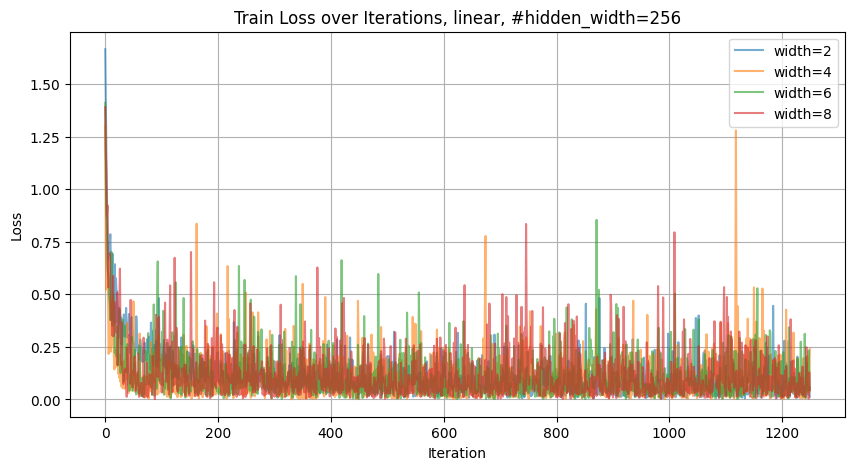

Epoch 1/10, Loss: 0.4704
Epoch 2/10, Loss: 0.2800
Epoch 3/10, Loss: 0.1708
Epoch 4/10, Loss: 0.1268
Epoch 5/10, Loss: 0.0514
Epoch 6/10, Loss: 0.0405
Epoch 7/10, Loss: 0.0326
Epoch 8/10, Loss: 0.0496
Epoch 9/10, Loss: 0.0319
Epoch 10/10, Loss: 0.0491
Training complete.
Epoch 1/10, Loss: 0.1621
Epoch 2/10, Loss: 0.3915
Epoch 3/10, Loss: 0.0966
Epoch 4/10, Loss: 0.0780
Epoch 5/10, Loss: 0.0461
Epoch 6/10, Loss: 0.0101
Epoch 7/10, Loss: 0.0065
Epoch 8/10, Loss: 0.0140
Epoch 9/10, Loss: 0.0741
Epoch 10/10, Loss: 0.0170
Training complete.
Epoch 1/10, Loss: 0.1317
Epoch 2/10, Loss: 0.0397
Epoch 3/10, Loss: 0.0484
Epoch 4/10, Loss: 0.1699
Epoch 5/10, Loss: 0.3358
Epoch 6/10, Loss: 0.0344
Epoch 7/10, Loss: 0.0078
Epoch 8/10, Loss: 0.0321
Epoch 9/10, Loss: 0.0274
Epoch 10/10, Loss: 0.0486
Training complete.
Epoch 1/10, Loss: 0.0882
Epoch 2/10, Loss: 0.0565
Epoch 3/10, Loss: 0.0313
Epoch 4/10, Loss: 0.0101
Epoch 5/10, Loss: 0.0181
Epoch 6/10, Loss: 0.0800
Epoch 7/10, Loss: 0.0259
Epoch 8/10, Los

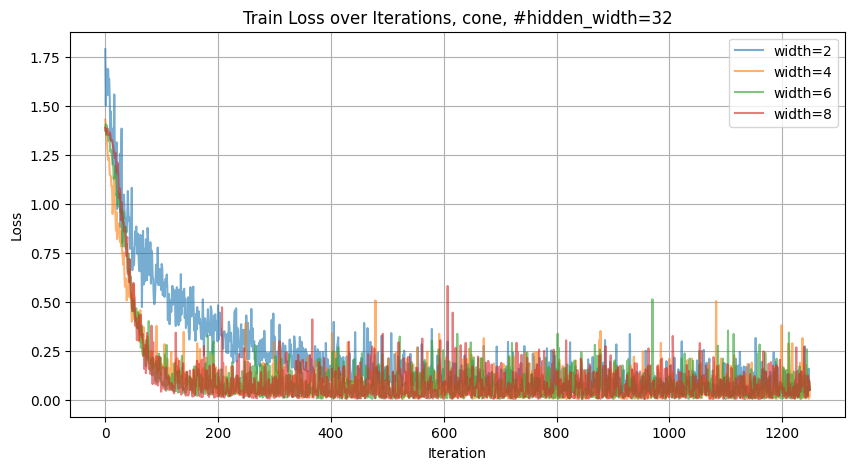

Epoch 1/10, Loss: 0.2624
Epoch 2/10, Loss: 0.1108
Epoch 3/10, Loss: 0.0996
Epoch 4/10, Loss: 0.2302
Epoch 5/10, Loss: 0.0467
Epoch 6/10, Loss: 0.0236
Epoch 7/10, Loss: 0.0767
Epoch 8/10, Loss: 0.1452
Epoch 9/10, Loss: 0.0399
Epoch 10/10, Loss: 0.1281
Training complete.
Epoch 1/10, Loss: 0.0280
Epoch 2/10, Loss: 0.0927
Epoch 3/10, Loss: 0.0774
Epoch 4/10, Loss: 0.0071
Epoch 5/10, Loss: 0.0212
Epoch 6/10, Loss: 0.1104
Epoch 7/10, Loss: 0.0286
Epoch 8/10, Loss: 0.1733
Epoch 9/10, Loss: 0.0253
Epoch 10/10, Loss: 0.0684
Training complete.
Epoch 1/10, Loss: 0.0210
Epoch 2/10, Loss: 0.0082
Epoch 3/10, Loss: 0.0180
Epoch 4/10, Loss: 0.0807
Epoch 5/10, Loss: 0.0140
Epoch 6/10, Loss: 0.1116
Epoch 7/10, Loss: 0.0593
Epoch 8/10, Loss: 0.0908
Epoch 9/10, Loss: 0.1095
Epoch 10/10, Loss: 0.0044
Training complete.
Epoch 1/10, Loss: 0.0386
Epoch 2/10, Loss: 0.0071
Epoch 3/10, Loss: 0.0993
Epoch 4/10, Loss: 0.0186
Epoch 5/10, Loss: 0.0046
Epoch 6/10, Loss: 0.1318
Epoch 7/10, Loss: 0.0618
Epoch 8/10, Los

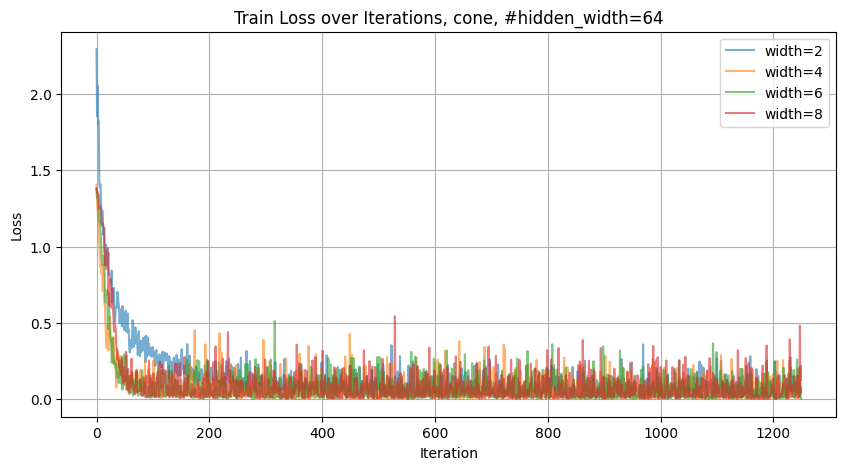

Epoch 1/10, Loss: 0.1657
Epoch 2/10, Loss: 0.1304
Epoch 3/10, Loss: 0.0348
Epoch 4/10, Loss: 0.0194
Epoch 5/10, Loss: 0.0263
Epoch 6/10, Loss: 0.0244
Epoch 7/10, Loss: 0.0833
Epoch 8/10, Loss: 0.0306
Epoch 9/10, Loss: 0.0453
Epoch 10/10, Loss: 0.0087
Training complete.
Epoch 1/10, Loss: 0.0262
Epoch 2/10, Loss: 0.0810
Epoch 3/10, Loss: 0.0167
Epoch 4/10, Loss: 0.0767
Epoch 5/10, Loss: 0.0159
Epoch 6/10, Loss: 0.0929
Epoch 7/10, Loss: 0.0495
Epoch 8/10, Loss: 0.0358
Epoch 9/10, Loss: 0.0101
Epoch 10/10, Loss: 0.0910
Training complete.
Epoch 1/10, Loss: 0.0774
Epoch 2/10, Loss: 0.0254
Epoch 3/10, Loss: 0.0270
Epoch 4/10, Loss: 0.1399
Epoch 5/10, Loss: 0.0414
Epoch 6/10, Loss: 0.0306
Epoch 7/10, Loss: 0.0055
Epoch 8/10, Loss: 0.1553
Epoch 9/10, Loss: 0.1284
Epoch 10/10, Loss: 0.0402
Training complete.
Epoch 1/10, Loss: 0.1716
Epoch 2/10, Loss: 0.0734
Epoch 3/10, Loss: 0.0173
Epoch 4/10, Loss: 0.0304
Epoch 5/10, Loss: 0.0135
Epoch 6/10, Loss: 0.0350
Epoch 7/10, Loss: 0.1378
Epoch 8/10, Los

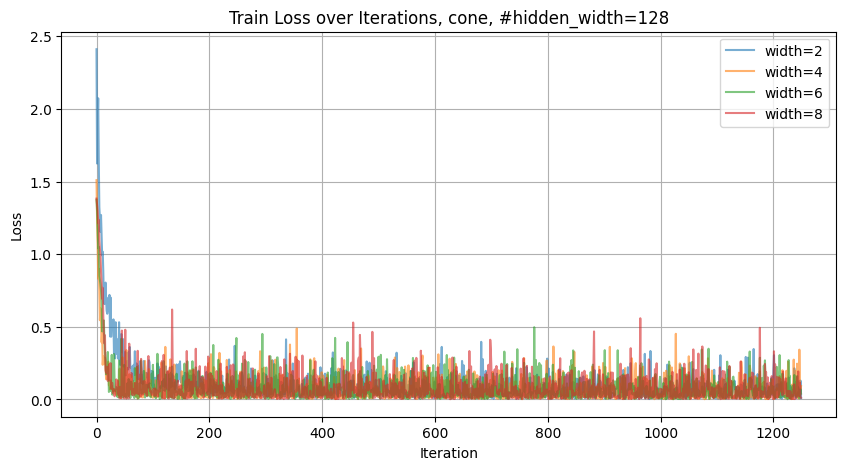

Epoch 1/10, Loss: 0.1541
Epoch 2/10, Loss: 0.1516
Epoch 3/10, Loss: 0.1628
Epoch 4/10, Loss: 0.0386
Epoch 5/10, Loss: 0.0157
Epoch 6/10, Loss: 0.0509
Epoch 7/10, Loss: 0.0422
Epoch 8/10, Loss: 0.0220
Epoch 9/10, Loss: 0.0182
Epoch 10/10, Loss: 0.0037
Training complete.
Epoch 1/10, Loss: 0.0323
Epoch 2/10, Loss: 0.1005
Epoch 3/10, Loss: 0.0393
Epoch 4/10, Loss: 0.0120
Epoch 5/10, Loss: 0.0895
Epoch 6/10, Loss: 0.1179
Epoch 7/10, Loss: 0.0278
Epoch 8/10, Loss: 0.0184
Epoch 9/10, Loss: 0.0170
Epoch 10/10, Loss: 0.0101
Training complete.
Epoch 1/10, Loss: 0.1520
Epoch 2/10, Loss: 0.0123
Epoch 3/10, Loss: 0.4596
Epoch 4/10, Loss: 0.0119
Epoch 5/10, Loss: 0.2394
Epoch 6/10, Loss: 0.0287
Epoch 7/10, Loss: 0.0344
Epoch 8/10, Loss: 0.0281
Epoch 9/10, Loss: 0.1825
Epoch 10/10, Loss: 0.1372
Training complete.
Epoch 1/10, Loss: 0.0086
Epoch 2/10, Loss: 0.0048
Epoch 3/10, Loss: 0.1586
Epoch 4/10, Loss: 0.0137
Epoch 5/10, Loss: 0.2355
Epoch 6/10, Loss: 0.2712
Epoch 7/10, Loss: 0.0224
Epoch 8/10, Los

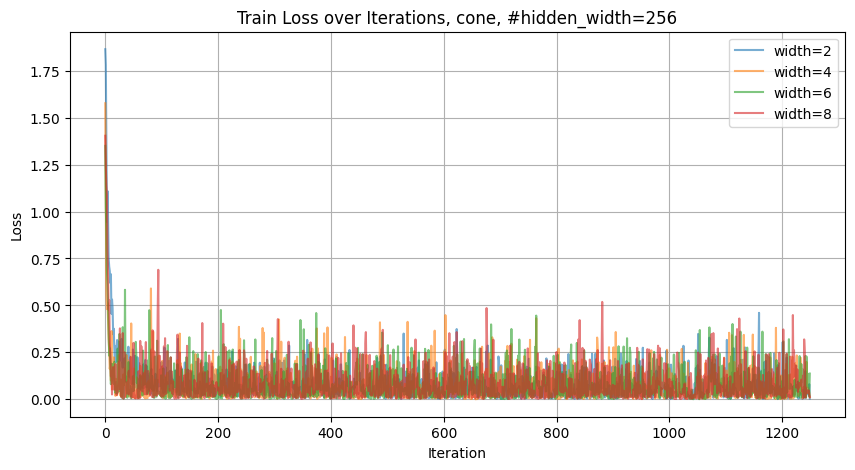

Epoch 1/10, Loss: 0.5367
Epoch 2/10, Loss: 0.3559
Epoch 3/10, Loss: 0.2420
Epoch 4/10, Loss: 0.1849
Epoch 5/10, Loss: 0.1578
Epoch 6/10, Loss: 0.1628
Epoch 7/10, Loss: 0.1563
Epoch 8/10, Loss: 0.0928
Epoch 9/10, Loss: 0.0419
Epoch 10/10, Loss: 0.3116
Training complete.
Epoch 1/10, Loss: 0.1751
Epoch 2/10, Loss: 0.0376
Epoch 3/10, Loss: 0.0265
Epoch 4/10, Loss: 0.0222
Epoch 5/10, Loss: 0.0256
Epoch 6/10, Loss: 0.0330
Epoch 7/10, Loss: 0.0178
Epoch 8/10, Loss: 0.0066
Epoch 9/10, Loss: 0.0515
Epoch 10/10, Loss: 0.0093
Training complete.
Epoch 1/10, Loss: 0.2860
Epoch 2/10, Loss: 0.0697
Epoch 3/10, Loss: 0.0448
Epoch 4/10, Loss: 0.0761
Epoch 5/10, Loss: 0.1114
Epoch 6/10, Loss: 0.0626
Epoch 7/10, Loss: 0.0142
Epoch 8/10, Loss: 0.0750
Epoch 9/10, Loss: 0.0230
Epoch 10/10, Loss: 0.0618
Training complete.
Epoch 1/10, Loss: 0.2151
Epoch 2/10, Loss: 0.0458
Epoch 3/10, Loss: 0.0905
Epoch 4/10, Loss: 0.0571
Epoch 5/10, Loss: 0.0400
Epoch 6/10, Loss: 0.1276
Epoch 7/10, Loss: 0.0180
Epoch 8/10, Los

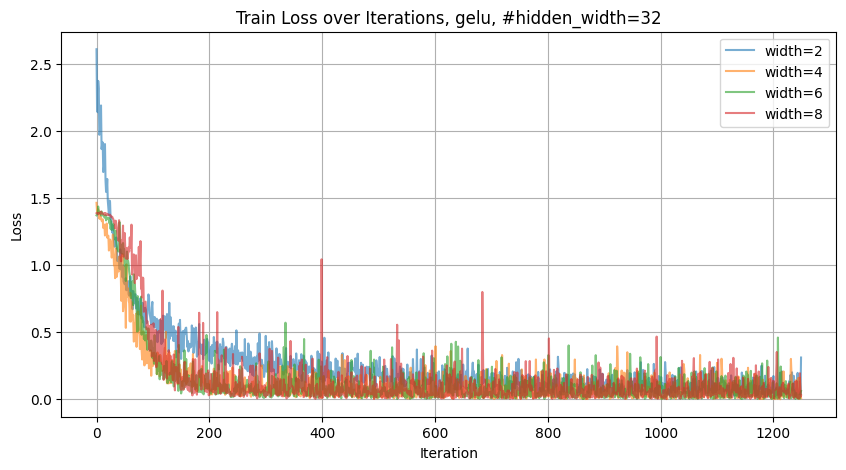

Epoch 1/10, Loss: 0.3859
Epoch 2/10, Loss: 0.2443
Epoch 3/10, Loss: 0.1934
Epoch 4/10, Loss: 0.0998
Epoch 5/10, Loss: 0.0645
Epoch 6/10, Loss: 0.1792
Epoch 7/10, Loss: 0.1103
Epoch 8/10, Loss: 0.0565
Epoch 9/10, Loss: 0.0273
Epoch 10/10, Loss: 0.0872
Training complete.
Epoch 1/10, Loss: 0.1257
Epoch 2/10, Loss: 0.1240
Epoch 3/10, Loss: 0.0900
Epoch 4/10, Loss: 0.0390
Epoch 5/10, Loss: 0.1540
Epoch 6/10, Loss: 0.1037
Epoch 7/10, Loss: 0.0807
Epoch 8/10, Loss: 0.2010
Epoch 9/10, Loss: 0.0390
Epoch 10/10, Loss: 0.0032
Training complete.
Epoch 1/10, Loss: 0.0750
Epoch 2/10, Loss: 0.2251
Epoch 3/10, Loss: 0.0568
Epoch 4/10, Loss: 0.0439
Epoch 5/10, Loss: 0.0471
Epoch 6/10, Loss: 0.0411
Epoch 7/10, Loss: 0.0245
Epoch 8/10, Loss: 0.0401
Epoch 9/10, Loss: 0.0143
Epoch 10/10, Loss: 0.0915
Training complete.
Epoch 1/10, Loss: 0.1240
Epoch 2/10, Loss: 0.0457
Epoch 3/10, Loss: 0.0810
Epoch 4/10, Loss: 0.3301
Epoch 5/10, Loss: 0.1280
Epoch 6/10, Loss: 0.1045
Epoch 7/10, Loss: 0.0598
Epoch 8/10, Los

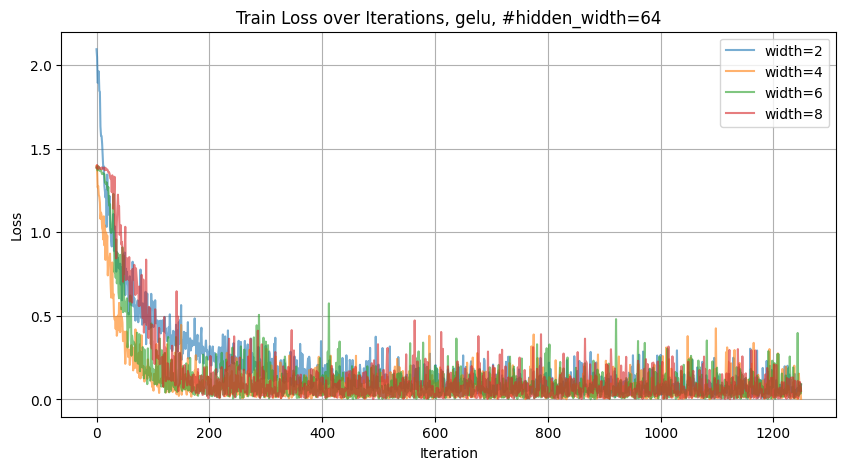

Epoch 1/10, Loss: 0.2623
Epoch 2/10, Loss: 0.1773
Epoch 3/10, Loss: 0.0802
Epoch 4/10, Loss: 0.0763
Epoch 5/10, Loss: 0.0729
Epoch 6/10, Loss: 0.0657
Epoch 7/10, Loss: 0.0494
Epoch 8/10, Loss: 0.0163
Epoch 9/10, Loss: 0.0377
Epoch 10/10, Loss: 0.0193
Training complete.
Epoch 1/10, Loss: 0.0176
Epoch 2/10, Loss: 0.2811
Epoch 3/10, Loss: 0.1031
Epoch 4/10, Loss: 0.1110
Epoch 5/10, Loss: 0.2032
Epoch 6/10, Loss: 0.0098
Epoch 7/10, Loss: 0.0697
Epoch 8/10, Loss: 0.1456
Epoch 9/10, Loss: 0.0036
Epoch 10/10, Loss: 0.2256
Training complete.
Epoch 1/10, Loss: 0.1783
Epoch 2/10, Loss: 0.1510
Epoch 3/10, Loss: 0.2010
Epoch 4/10, Loss: 0.0185
Epoch 5/10, Loss: 0.0356
Epoch 6/10, Loss: 0.0149
Epoch 7/10, Loss: 0.0444
Epoch 8/10, Loss: 0.1823
Epoch 9/10, Loss: 0.0190
Epoch 10/10, Loss: 0.2545
Training complete.
Epoch 1/10, Loss: 0.0654
Epoch 2/10, Loss: 0.0953
Epoch 3/10, Loss: 0.1032
Epoch 4/10, Loss: 0.1255
Epoch 5/10, Loss: 0.0416
Epoch 6/10, Loss: 0.1513
Epoch 7/10, Loss: 0.1188
Epoch 8/10, Los

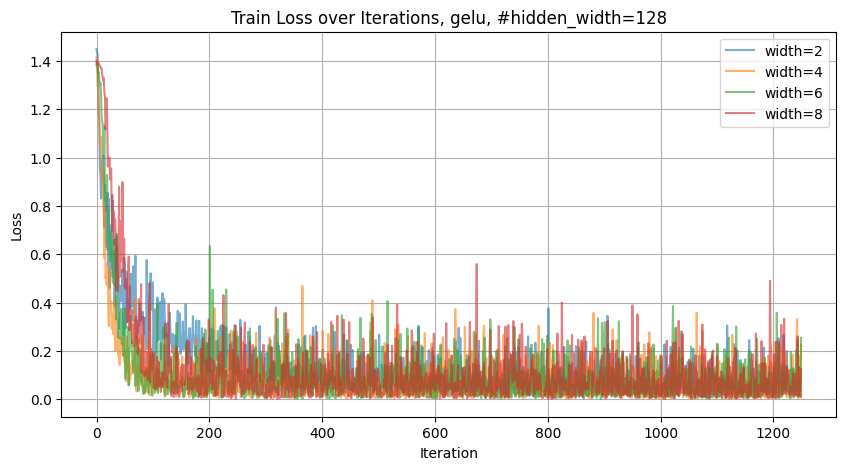

Epoch 1/10, Loss: 0.1821
Epoch 2/10, Loss: 0.0932
Epoch 3/10, Loss: 0.1454
Epoch 4/10, Loss: 0.0900
Epoch 5/10, Loss: 0.1451
Epoch 6/10, Loss: 0.0509
Epoch 7/10, Loss: 0.2792
Epoch 8/10, Loss: 0.0453
Epoch 9/10, Loss: 0.0225
Epoch 10/10, Loss: 0.0682
Training complete.
Epoch 1/10, Loss: 0.1531
Epoch 2/10, Loss: 0.1650
Epoch 3/10, Loss: 0.0090
Epoch 4/10, Loss: 0.1320
Epoch 5/10, Loss: 0.0256
Epoch 6/10, Loss: 0.0703
Epoch 7/10, Loss: 0.0290
Epoch 8/10, Loss: 0.0555
Epoch 9/10, Loss: 0.0855
Epoch 10/10, Loss: 0.1333
Training complete.
Epoch 1/10, Loss: 0.2249
Epoch 2/10, Loss: 0.1272
Epoch 3/10, Loss: 0.1315
Epoch 4/10, Loss: 0.0122
Epoch 5/10, Loss: 0.0374
Epoch 6/10, Loss: 0.0781
Epoch 7/10, Loss: 0.0684
Epoch 8/10, Loss: 0.0425
Epoch 9/10, Loss: 0.0268
Epoch 10/10, Loss: 0.1232
Training complete.
Epoch 1/10, Loss: 0.0157
Epoch 2/10, Loss: 0.0208
Epoch 3/10, Loss: 0.0696
Epoch 4/10, Loss: 0.0904
Epoch 5/10, Loss: 0.3214
Epoch 6/10, Loss: 0.4438
Epoch 7/10, Loss: 0.0178
Epoch 8/10, Los

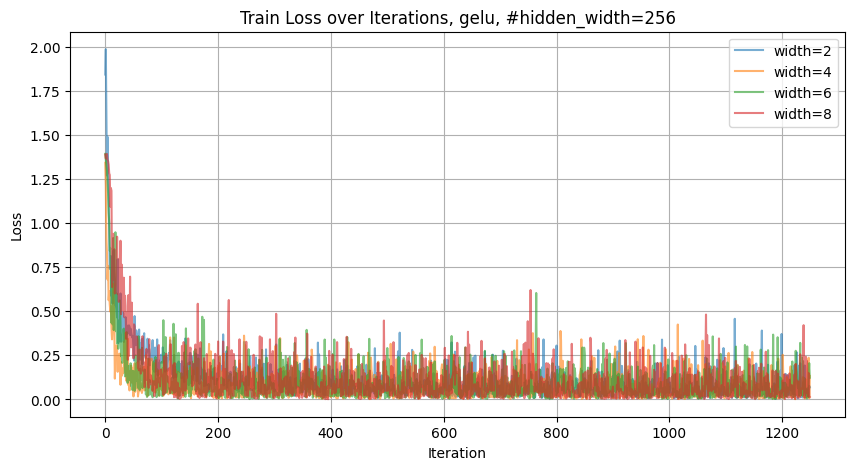

Epoch 1/10, Loss: 0.5046
Epoch 2/10, Loss: 0.3772
Epoch 3/10, Loss: 0.2529
Epoch 4/10, Loss: 0.2415
Epoch 5/10, Loss: 0.0770
Epoch 6/10, Loss: 0.1442
Epoch 7/10, Loss: 0.2174
Epoch 8/10, Loss: 0.0334
Epoch 9/10, Loss: 0.0691
Epoch 10/10, Loss: 0.1484
Training complete.
Epoch 1/10, Loss: 0.1933
Epoch 2/10, Loss: 0.0956
Epoch 3/10, Loss: 0.0584
Epoch 4/10, Loss: 0.0238
Epoch 5/10, Loss: 0.1371
Epoch 6/10, Loss: 0.0088
Epoch 7/10, Loss: 0.0195
Epoch 8/10, Loss: 0.0106
Epoch 9/10, Loss: 0.0906
Epoch 10/10, Loss: 0.0311
Training complete.
Epoch 1/10, Loss: 0.0978
Epoch 2/10, Loss: 0.0417
Epoch 3/10, Loss: 0.0130
Epoch 4/10, Loss: 0.0967
Epoch 5/10, Loss: 0.1042
Epoch 6/10, Loss: 0.0374
Epoch 7/10, Loss: 0.2197
Epoch 8/10, Loss: 0.0107
Epoch 9/10, Loss: 0.0185
Epoch 10/10, Loss: 0.1282
Training complete.
Epoch 1/10, Loss: 0.0428
Epoch 2/10, Loss: 0.0677
Epoch 3/10, Loss: 0.1352
Epoch 4/10, Loss: 0.0725
Epoch 5/10, Loss: 0.0244
Epoch 6/10, Loss: 0.0401
Epoch 7/10, Loss: 0.0316
Epoch 8/10, Los

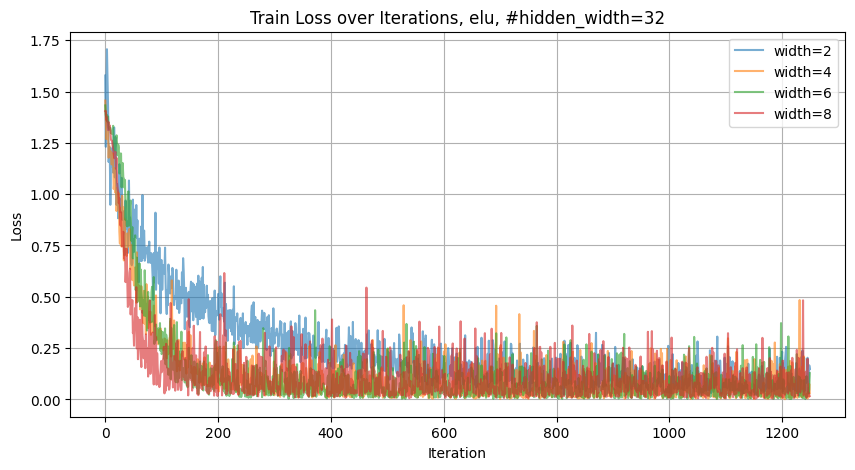

Epoch 1/10, Loss: 0.2509
Epoch 2/10, Loss: 0.1785
Epoch 3/10, Loss: 0.1464
Epoch 4/10, Loss: 0.0606
Epoch 5/10, Loss: 0.0367
Epoch 6/10, Loss: 0.0875
Epoch 7/10, Loss: 0.0642
Epoch 8/10, Loss: 0.0366
Epoch 9/10, Loss: 0.0150
Epoch 10/10, Loss: 0.0646
Training complete.
Epoch 1/10, Loss: 0.1764
Epoch 2/10, Loss: 0.0053
Epoch 3/10, Loss: 0.0647
Epoch 4/10, Loss: 0.0554
Epoch 5/10, Loss: 0.0041
Epoch 6/10, Loss: 0.0253
Epoch 7/10, Loss: 0.0457
Epoch 8/10, Loss: 0.0263
Epoch 9/10, Loss: 0.2730
Epoch 10/10, Loss: 0.1443
Training complete.
Epoch 1/10, Loss: 0.0325
Epoch 2/10, Loss: 0.0704
Epoch 3/10, Loss: 0.0547
Epoch 4/10, Loss: 0.0240
Epoch 5/10, Loss: 0.1160
Epoch 6/10, Loss: 0.0232
Epoch 7/10, Loss: 0.0299
Epoch 8/10, Loss: 0.0212
Epoch 9/10, Loss: 0.0985
Epoch 10/10, Loss: 0.2896
Training complete.
Epoch 1/10, Loss: 0.0670
Epoch 2/10, Loss: 0.0675
Epoch 3/10, Loss: 0.0598
Epoch 4/10, Loss: 0.0651
Epoch 5/10, Loss: 0.0537
Epoch 6/10, Loss: 0.0774
Epoch 7/10, Loss: 0.1141
Epoch 8/10, Los

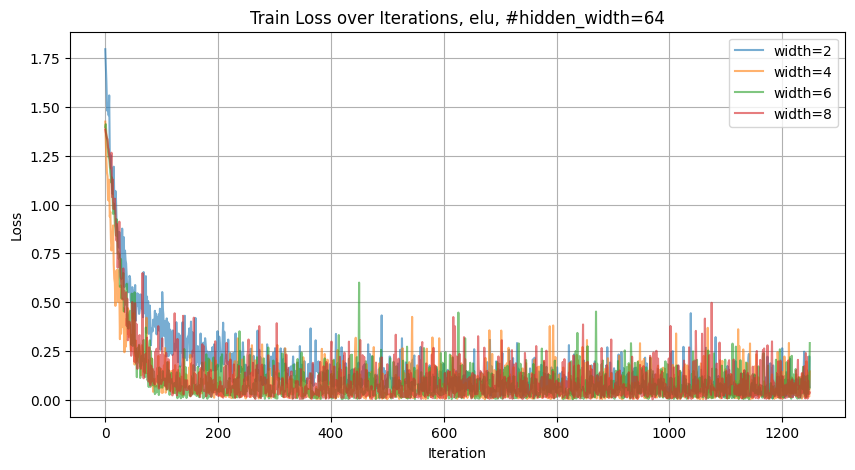

Epoch 1/10, Loss: 0.2071
Epoch 2/10, Loss: 0.2011
Epoch 3/10, Loss: 0.1083
Epoch 4/10, Loss: 0.0538
Epoch 5/10, Loss: 0.0569
Epoch 6/10, Loss: 0.0894
Epoch 7/10, Loss: 0.1519
Epoch 8/10, Loss: 0.0670
Epoch 9/10, Loss: 0.1341
Epoch 10/10, Loss: 0.0270
Training complete.
Epoch 1/10, Loss: 0.0195
Epoch 2/10, Loss: 0.0338
Epoch 3/10, Loss: 0.1529
Epoch 4/10, Loss: 0.0168
Epoch 5/10, Loss: 0.0311
Epoch 6/10, Loss: 0.0669
Epoch 7/10, Loss: 0.0538
Epoch 8/10, Loss: 0.0208
Epoch 9/10, Loss: 0.0416
Epoch 10/10, Loss: 0.0216
Training complete.
Epoch 1/10, Loss: 0.1181
Epoch 2/10, Loss: 0.0952
Epoch 3/10, Loss: 0.0215
Epoch 4/10, Loss: 0.0198
Epoch 5/10, Loss: 0.0885
Epoch 6/10, Loss: 0.0133
Epoch 7/10, Loss: 0.1697
Epoch 8/10, Loss: 0.0632
Epoch 9/10, Loss: 0.0159
Epoch 10/10, Loss: 0.0898
Training complete.
Epoch 1/10, Loss: 0.0951
Epoch 2/10, Loss: 0.0755
Epoch 3/10, Loss: 0.0098
Epoch 4/10, Loss: 0.0709
Epoch 5/10, Loss: 0.0509
Epoch 6/10, Loss: 0.0181
Epoch 7/10, Loss: 0.1140
Epoch 8/10, Los

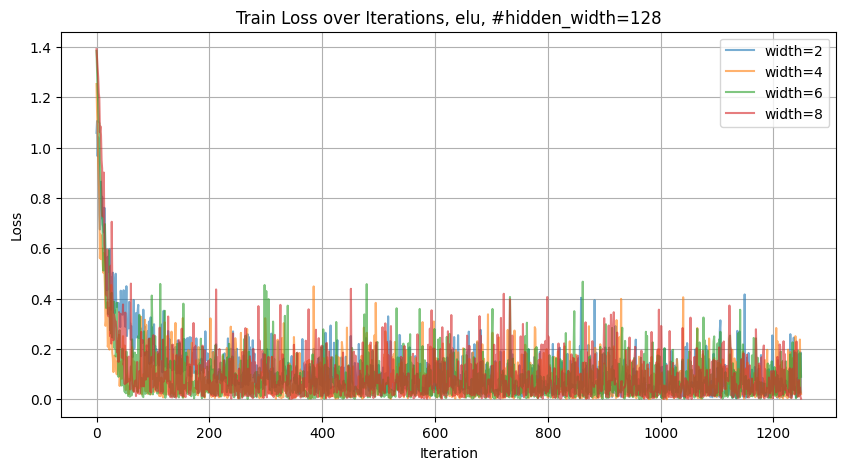

Epoch 1/10, Loss: 0.1424
Epoch 2/10, Loss: 0.0881
Epoch 3/10, Loss: 0.1200
Epoch 4/10, Loss: 0.1096
Epoch 5/10, Loss: 0.0214
Epoch 6/10, Loss: 0.1911
Epoch 7/10, Loss: 0.0764
Epoch 8/10, Loss: 0.0255
Epoch 9/10, Loss: 0.0709
Epoch 10/10, Loss: 0.1009
Training complete.
Epoch 1/10, Loss: 0.0688
Epoch 2/10, Loss: 0.1570
Epoch 3/10, Loss: 0.0466
Epoch 4/10, Loss: 0.0304
Epoch 5/10, Loss: 0.0072
Epoch 6/10, Loss: 0.3393
Epoch 7/10, Loss: 0.0086
Epoch 8/10, Loss: 0.0192
Epoch 9/10, Loss: 0.2011
Epoch 10/10, Loss: 0.2598
Training complete.
Epoch 1/10, Loss: 0.0272
Epoch 2/10, Loss: 0.0735
Epoch 3/10, Loss: 0.0205
Epoch 4/10, Loss: 0.0452
Epoch 5/10, Loss: 0.0435
Epoch 6/10, Loss: 0.0497
Epoch 7/10, Loss: 0.0762
Epoch 8/10, Loss: 0.1130
Epoch 9/10, Loss: 0.0455
Epoch 10/10, Loss: 0.0197
Training complete.
Epoch 1/10, Loss: 0.1373
Epoch 2/10, Loss: 0.0500
Epoch 3/10, Loss: 0.0072
Epoch 4/10, Loss: 0.0975
Epoch 5/10, Loss: 0.0522
Epoch 6/10, Loss: 0.0296
Epoch 7/10, Loss: 0.2176
Epoch 8/10, Los

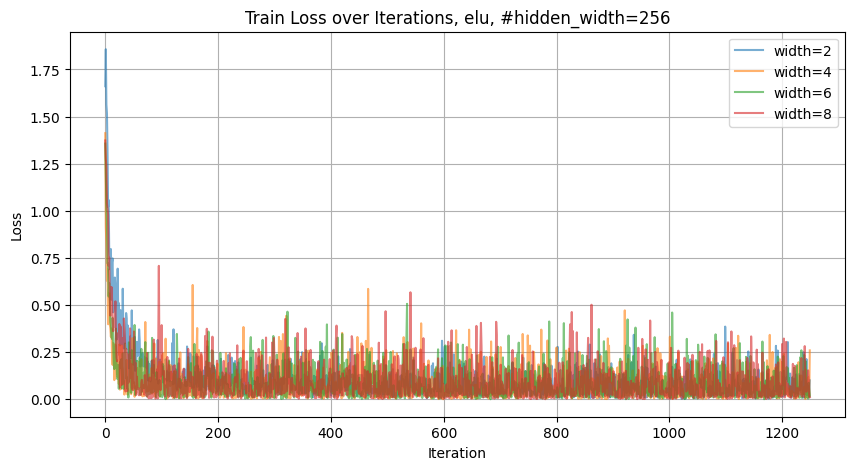

In [33]:
activs = ['relu','tanh', 'linear'] #['relu', 'tanh', 'linear', 'cone', 'gelu', 'elu']

num_layers = [2,4,6,8]
hidden_widths = [32,64,128,256] #[32,64,128,256]

criterion = nn.CrossEntropyLoss() # Use cross-entropy loss

num_epochs = 10 # Define number of epochs to train


for activ in activs:
    for hidden_width in hidden_widths:
        
        # Plot the loss over iterations
        plt.figure(figsize=(10, 5))
        for num_layer in num_layers:
        
            model2 = SimpleNN2(activ, num_classes=4, num_layer, hidden_width)
            
            optimizer = optim.Adam(model2.parameters(), lr=0.001) # Use Adam optimizer
            
            

            
            losses = []
            #             losses_test = []
            for epoch in range(num_epochs):
                for inputs, targets in dataloader_train: # the dataloader defines size of mini-batch (here 32)
                    # Zero the parameter gradients
                    optimizer.zero_grad()
                    # Forward pass
                    outputs = model2(inputs) # model prediction of the outputs
                    loss = criterion(outputs, targets) # calculate the loss over the mini-batch
                    # Backward pass and optimization
                    loss.backward() # the infamous backpropagation
                    optimizer.step() # update the parameters in your model based on backpropaged gradients, i.e. x_k+1 = x_k - eta * grad f(x_k)
                    # Record the loss
                    losses.append(loss.item())
                    
                print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}')
            print('Training complete.')

        
            plt.plot(losses, alpha=0.6, label=f'width={num_layer}')
            #             plt.plot(losses_test, label='Test Loss')
        plt.xlabel('Iteration')
        plt.ylabel('Loss')
        plt.title(f'Train Loss over Iterations, {activ}, #hidden_width={hidden_width}')
        plt.legend()
        plt.grid(True)
        plt.show()


Epoch 1/10, Loss: 0.4163
Epoch 2/10, Loss: 0.1783
Epoch 3/10, Loss: 0.0770
Epoch 4/10, Loss: 0.0470
Epoch 5/10, Loss: 0.1096
Epoch 6/10, Loss: 0.0650
Epoch 7/10, Loss: 0.0340
Epoch 8/10, Loss: 0.0662
Epoch 9/10, Loss: 0.0470
Epoch 10/10, Loss: 0.0846
Training complete.


<Figure size 1000x500 with 0 Axes>

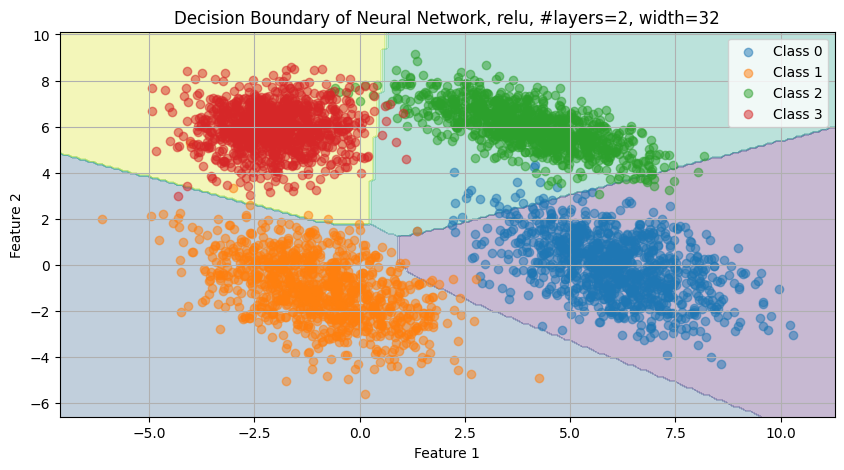

Epoch 1/10, Loss: 0.0792
Epoch 2/10, Loss: 0.0699
Epoch 3/10, Loss: 0.0446
Epoch 4/10, Loss: 0.1046
Epoch 5/10, Loss: 0.0887
Epoch 6/10, Loss: 0.0908
Epoch 7/10, Loss: 0.0139
Epoch 8/10, Loss: 0.0335
Epoch 9/10, Loss: 0.0033
Epoch 10/10, Loss: 0.0289
Training complete.


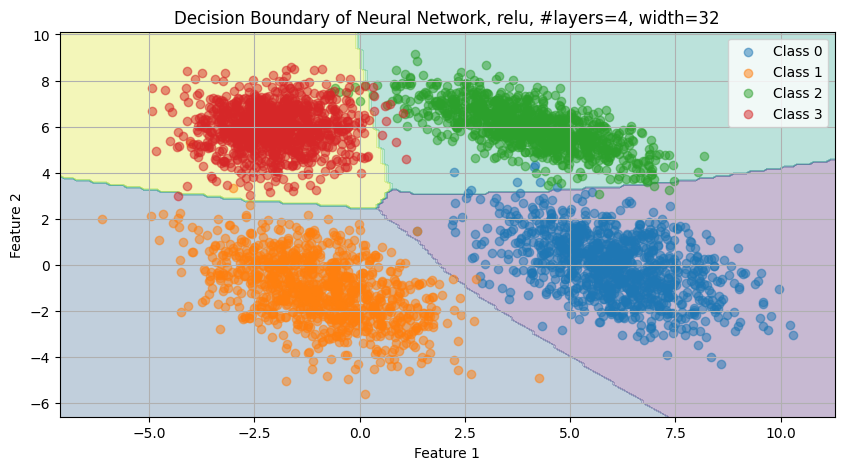

Epoch 1/10, Loss: 0.0505
Epoch 2/10, Loss: 0.0879
Epoch 3/10, Loss: 0.1057
Epoch 4/10, Loss: 0.0658
Epoch 5/10, Loss: 0.1024
Epoch 6/10, Loss: 0.0172
Epoch 7/10, Loss: 0.0065
Epoch 8/10, Loss: 0.0268
Epoch 9/10, Loss: 0.0149
Epoch 10/10, Loss: 0.0098
Training complete.


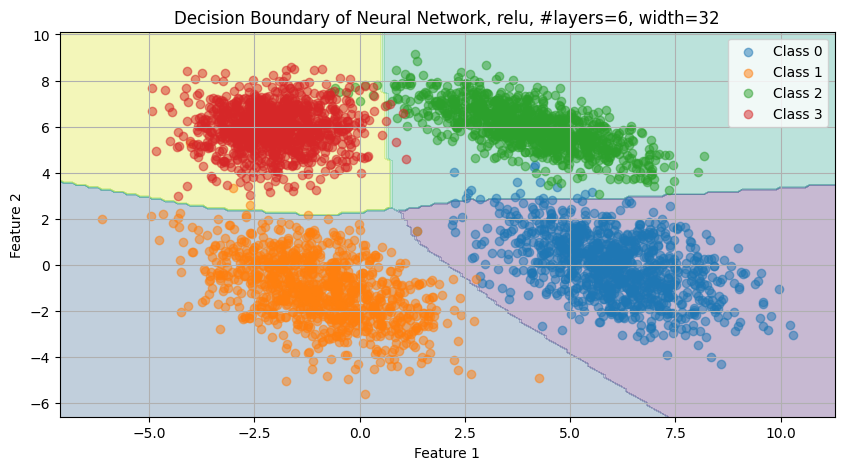

Epoch 1/10, Loss: 0.0186
Epoch 2/10, Loss: 0.0150
Epoch 3/10, Loss: 0.0115
Epoch 4/10, Loss: 0.1165
Epoch 5/10, Loss: 0.0061
Epoch 6/10, Loss: 0.0368
Epoch 7/10, Loss: 0.2623
Epoch 8/10, Loss: 0.0058
Epoch 9/10, Loss: 0.0054
Epoch 10/10, Loss: 0.0021
Training complete.


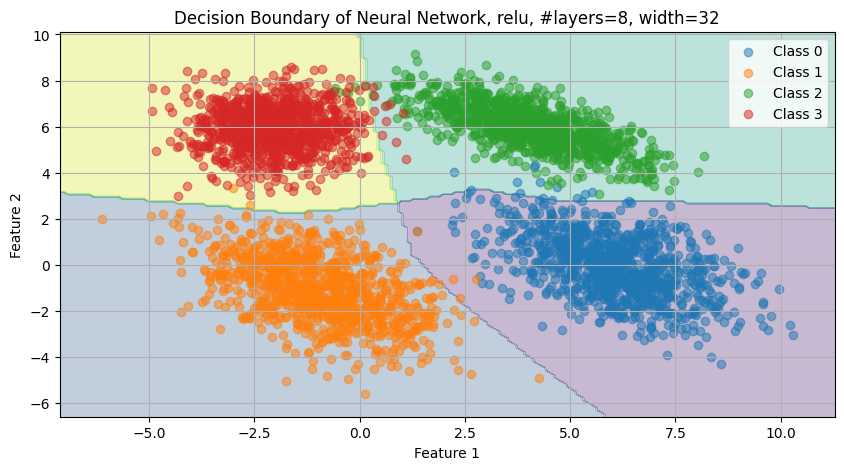

Epoch 1/10, Loss: 0.1260
Epoch 2/10, Loss: 0.0463
Epoch 3/10, Loss: 0.0656
Epoch 4/10, Loss: 0.0461
Epoch 5/10, Loss: 0.0632
Epoch 6/10, Loss: 0.0487
Epoch 7/10, Loss: 0.0452
Epoch 8/10, Loss: 0.0399
Epoch 9/10, Loss: 0.0594
Epoch 10/10, Loss: 0.0102
Training complete.


<Figure size 1000x500 with 0 Axes>

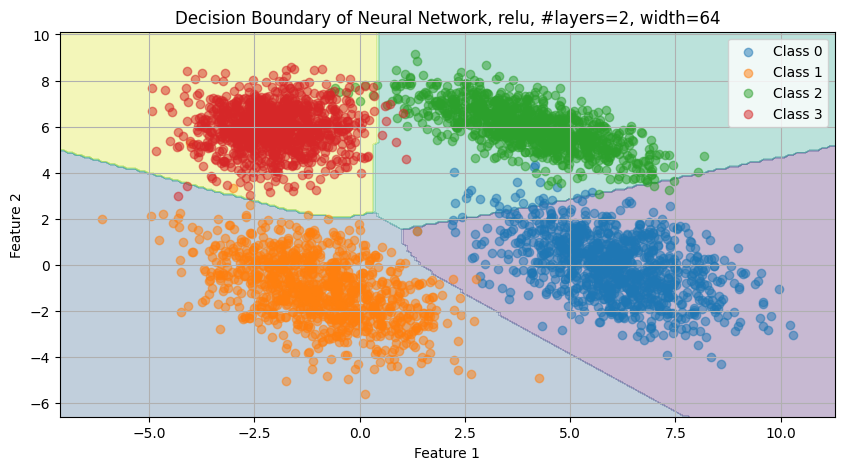

Epoch 1/10, Loss: 0.0340
Epoch 2/10, Loss: 0.0521
Epoch 3/10, Loss: 0.1394
Epoch 4/10, Loss: 0.1623
Epoch 5/10, Loss: 0.2156
Epoch 6/10, Loss: 0.0043
Epoch 7/10, Loss: 0.0042
Epoch 8/10, Loss: 0.0800
Epoch 9/10, Loss: 0.0025
Epoch 10/10, Loss: 0.2715
Training complete.


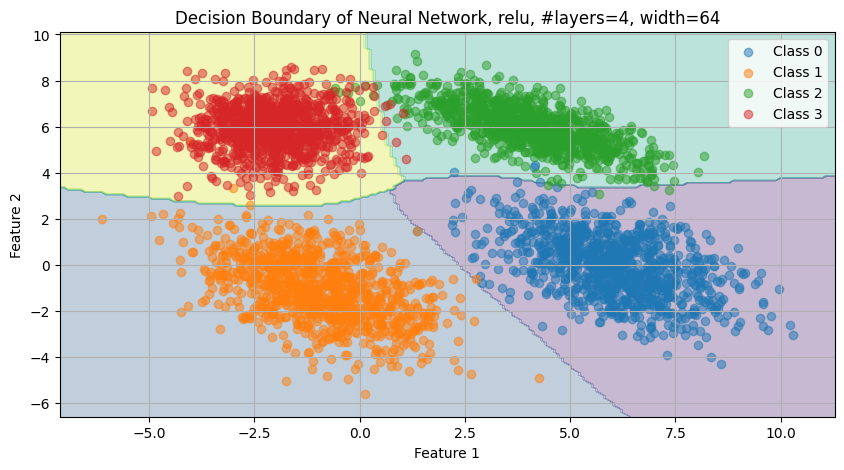

Epoch 1/10, Loss: 0.1351
Epoch 2/10, Loss: 0.0297
Epoch 3/10, Loss: 0.4226
Epoch 4/10, Loss: 0.0095
Epoch 5/10, Loss: 0.0305
Epoch 6/10, Loss: 0.0032
Epoch 7/10, Loss: 0.0022
Epoch 8/10, Loss: 0.0652
Epoch 9/10, Loss: 0.0226
Epoch 10/10, Loss: 0.0106
Training complete.


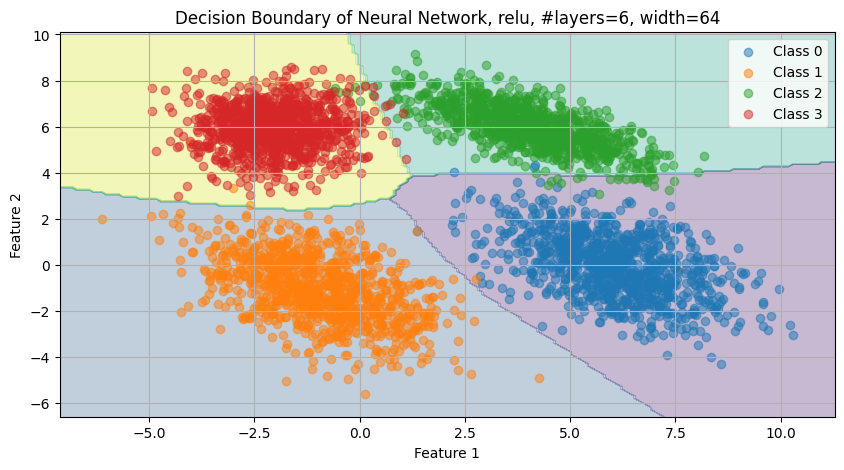

Epoch 1/10, Loss: 0.0317
Epoch 2/10, Loss: 0.0232
Epoch 3/10, Loss: 0.0902
Epoch 4/10, Loss: 0.0317
Epoch 5/10, Loss: 0.0453
Epoch 6/10, Loss: 0.1414
Epoch 7/10, Loss: 0.1303
Epoch 8/10, Loss: 0.0040
Epoch 9/10, Loss: 0.3337
Epoch 10/10, Loss: 0.0036
Training complete.


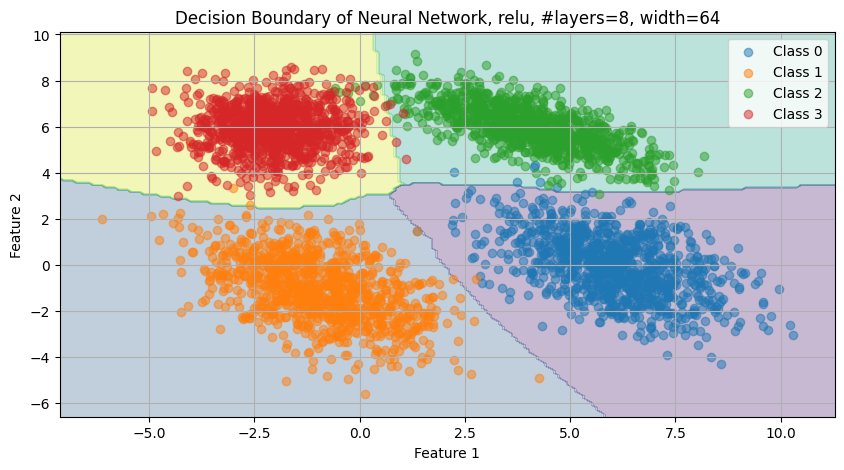

Epoch 1/10, Loss: 0.0840
Epoch 2/10, Loss: 0.0236
Epoch 3/10, Loss: 0.0741
Epoch 4/10, Loss: 0.0154
Epoch 5/10, Loss: 0.0887
Epoch 6/10, Loss: 0.0214
Epoch 7/10, Loss: 0.0619
Epoch 8/10, Loss: 0.0070
Epoch 9/10, Loss: 0.0648
Epoch 10/10, Loss: 0.0369
Training complete.


<Figure size 1000x500 with 0 Axes>

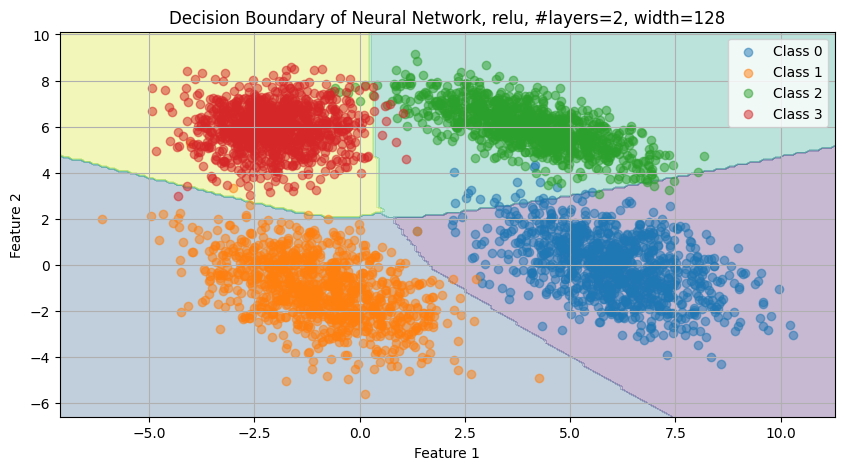

Epoch 1/10, Loss: 0.1186
Epoch 2/10, Loss: 0.0137
Epoch 3/10, Loss: 0.0230
Epoch 4/10, Loss: 0.0099
Epoch 5/10, Loss: 0.0079
Epoch 6/10, Loss: 0.0441
Epoch 7/10, Loss: 0.0016
Epoch 8/10, Loss: 0.1185
Epoch 9/10, Loss: 0.0014
Epoch 10/10, Loss: 0.0014
Training complete.


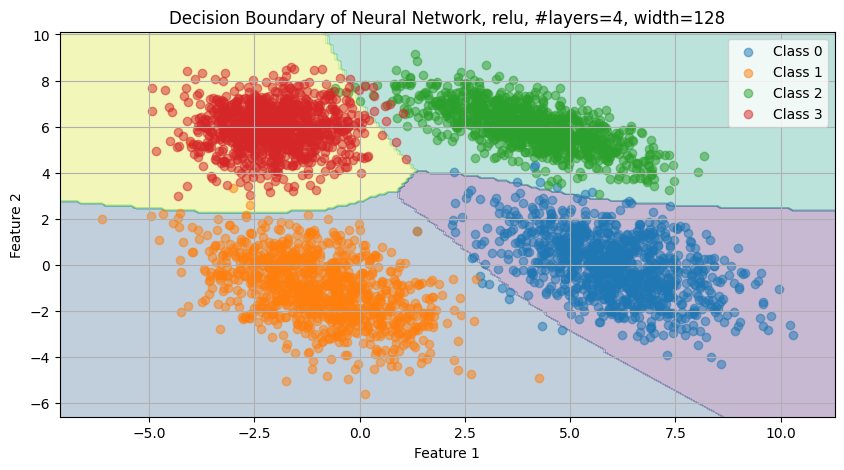

Epoch 1/10, Loss: 0.0305
Epoch 2/10, Loss: 0.1128
Epoch 3/10, Loss: 0.0712
Epoch 4/10, Loss: 0.0184
Epoch 5/10, Loss: 0.0256
Epoch 6/10, Loss: 0.0197
Epoch 7/10, Loss: 0.1239
Epoch 8/10, Loss: 0.0171
Epoch 9/10, Loss: 0.0027
Epoch 10/10, Loss: 0.0122
Training complete.


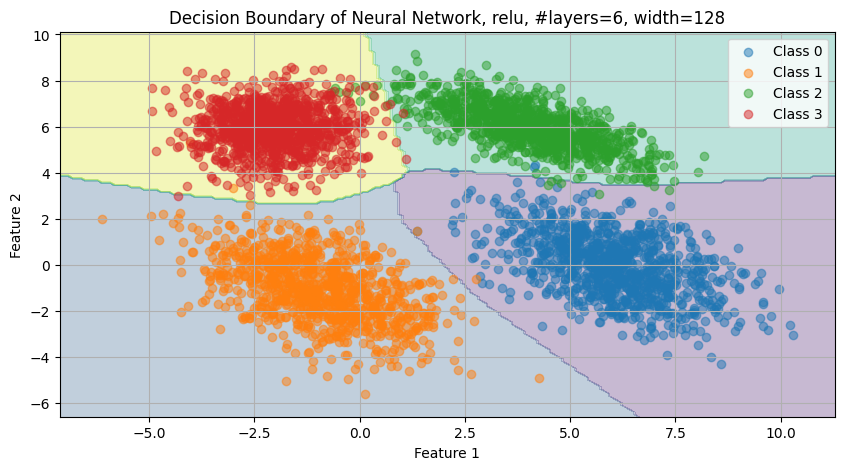

Epoch 1/10, Loss: 0.0069
Epoch 2/10, Loss: 0.1705
Epoch 3/10, Loss: 0.0210
Epoch 4/10, Loss: 0.0050
Epoch 5/10, Loss: 0.0098
Epoch 6/10, Loss: 0.3284
Epoch 7/10, Loss: 0.0065
Epoch 8/10, Loss: 0.0152
Epoch 9/10, Loss: 0.0376
Epoch 10/10, Loss: 0.0619
Training complete.


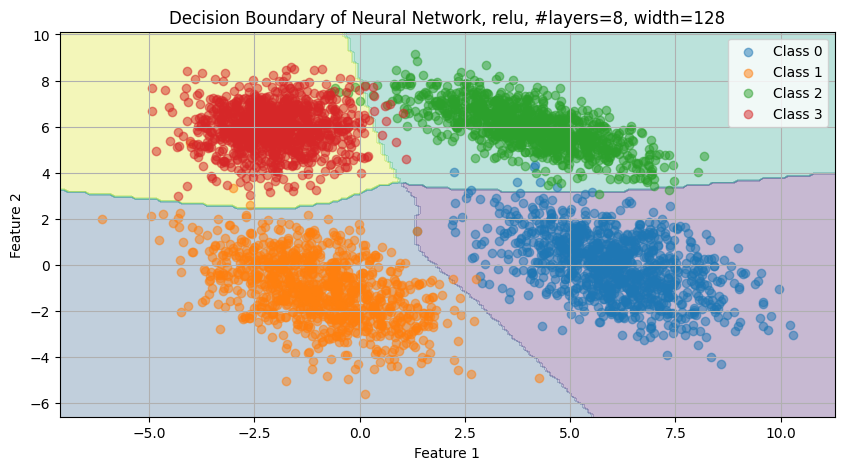

Epoch 1/10, Loss: 0.0549
Epoch 2/10, Loss: 0.0505
Epoch 3/10, Loss: 0.1281
Epoch 4/10, Loss: 0.0225
Epoch 5/10, Loss: 0.0604
Epoch 6/10, Loss: 0.0889
Epoch 7/10, Loss: 0.0434
Epoch 8/10, Loss: 0.0043
Epoch 9/10, Loss: 0.0124
Epoch 10/10, Loss: 0.0039
Training complete.


<Figure size 1000x500 with 0 Axes>

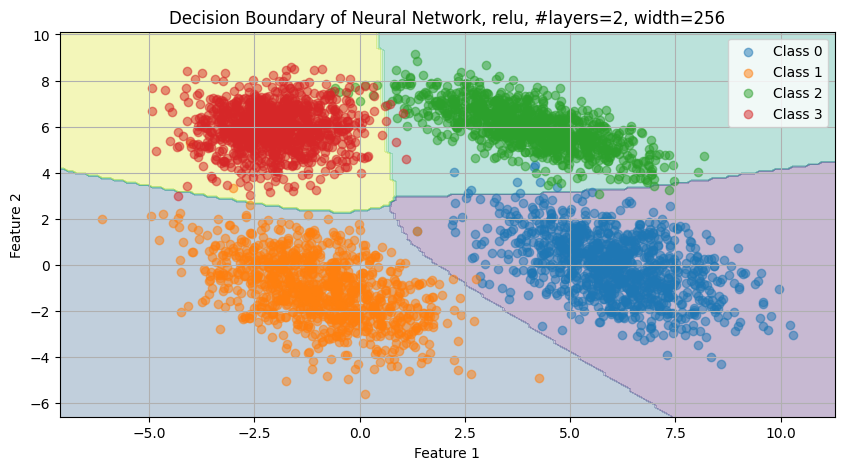

Epoch 1/10, Loss: 0.0389
Epoch 2/10, Loss: 0.0360
Epoch 3/10, Loss: 0.0129
Epoch 4/10, Loss: 0.0019
Epoch 5/10, Loss: 0.2424
Epoch 6/10, Loss: 0.0022
Epoch 7/10, Loss: 0.0171
Epoch 8/10, Loss: 0.0437
Epoch 9/10, Loss: 0.0099
Epoch 10/10, Loss: 0.0012
Training complete.


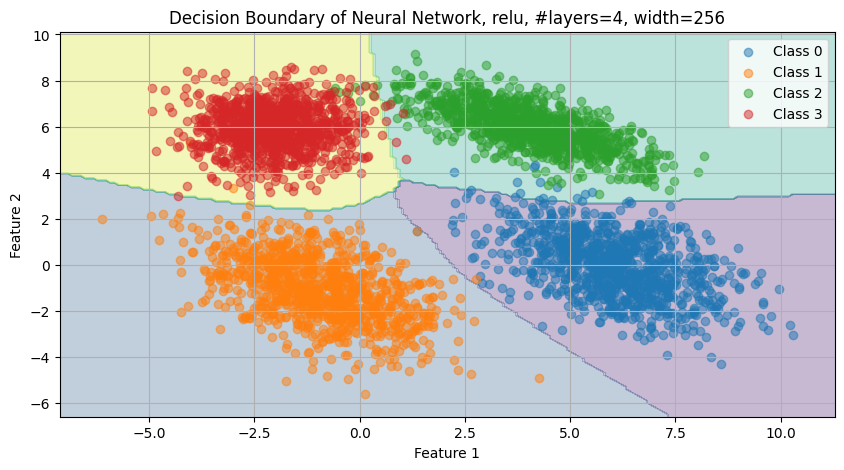

Epoch 1/10, Loss: 0.0943
Epoch 2/10, Loss: 0.0128
Epoch 3/10, Loss: 0.0961
Epoch 4/10, Loss: 0.0050
Epoch 5/10, Loss: 0.0742
Epoch 6/10, Loss: 0.0963
Epoch 7/10, Loss: 0.0238
Epoch 8/10, Loss: 0.0017
Epoch 9/10, Loss: 0.0019
Epoch 10/10, Loss: 0.0027
Training complete.


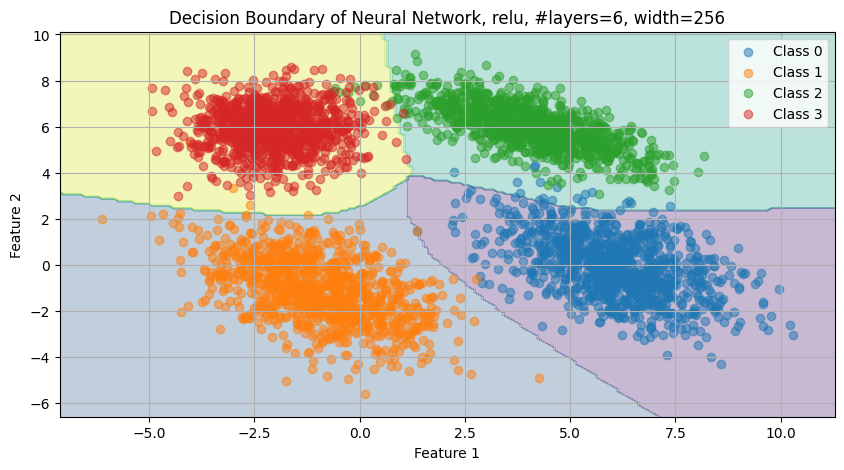

Epoch 1/10, Loss: 0.0982
Epoch 2/10, Loss: 0.2050
Epoch 3/10, Loss: 0.1200
Epoch 4/10, Loss: 0.0400
Epoch 5/10, Loss: 0.1746
Epoch 6/10, Loss: 0.0074
Epoch 7/10, Loss: 0.0031
Epoch 8/10, Loss: 0.1037
Epoch 9/10, Loss: 0.0112
Epoch 10/10, Loss: 0.0373
Training complete.


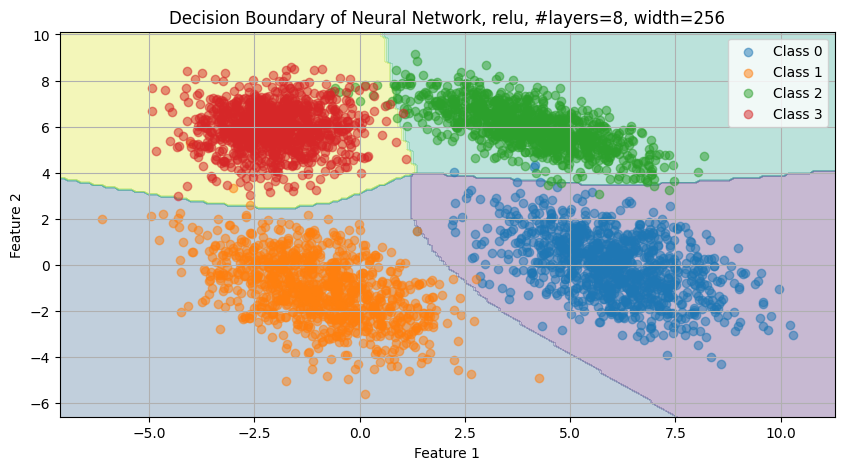

Epoch 1/10, Loss: 0.4910
Epoch 2/10, Loss: 0.1645
Epoch 3/10, Loss: 0.0798
Epoch 4/10, Loss: 0.1522
Epoch 5/10, Loss: 0.0580
Epoch 6/10, Loss: 0.0318
Epoch 7/10, Loss: 0.0486
Epoch 8/10, Loss: 0.0380
Epoch 9/10, Loss: 0.0430
Epoch 10/10, Loss: 0.0229
Training complete.


<Figure size 1000x500 with 0 Axes>

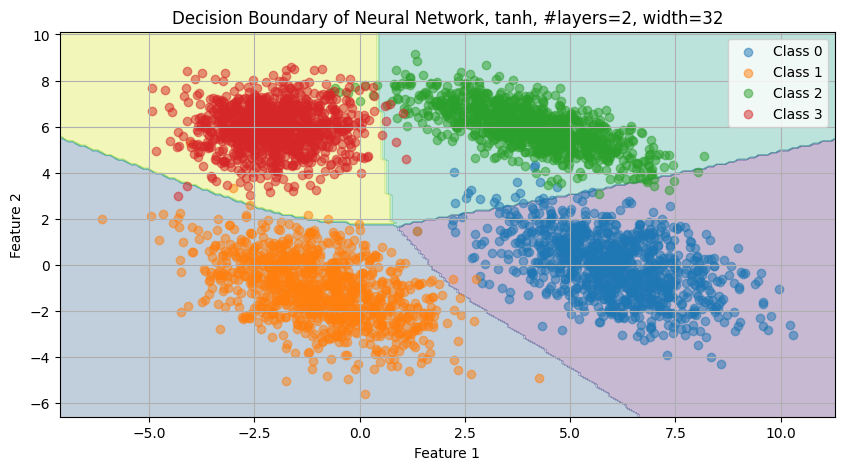

Epoch 1/10, Loss: 0.1382
Epoch 2/10, Loss: 0.0549
Epoch 3/10, Loss: 0.0748
Epoch 4/10, Loss: 0.0613
Epoch 5/10, Loss: 0.2368
Epoch 6/10, Loss: 0.0156
Epoch 7/10, Loss: 0.1056
Epoch 8/10, Loss: 0.0074
Epoch 9/10, Loss: 0.0038
Epoch 10/10, Loss: 0.0067
Training complete.


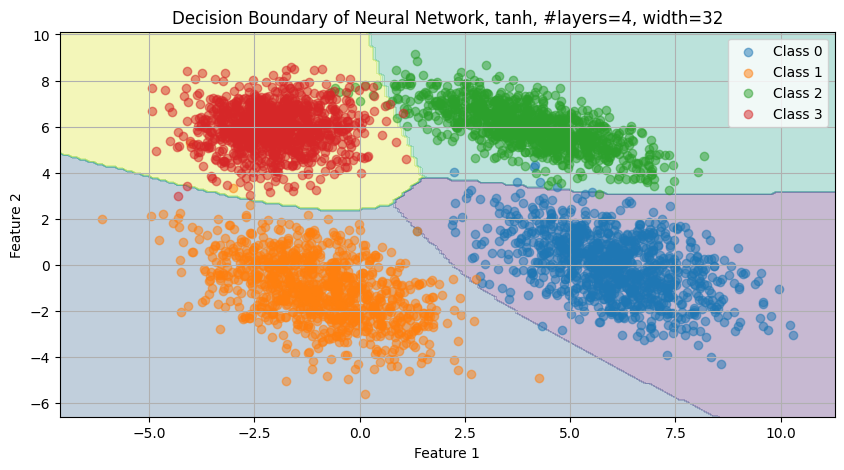

Epoch 1/10, Loss: 0.0926
Epoch 2/10, Loss: 0.0277
Epoch 3/10, Loss: 0.0169
Epoch 4/10, Loss: 0.0153
Epoch 5/10, Loss: 0.0060
Epoch 6/10, Loss: 0.0133
Epoch 7/10, Loss: 0.0055
Epoch 8/10, Loss: 0.1036
Epoch 9/10, Loss: 0.1035
Epoch 10/10, Loss: 0.0035
Training complete.


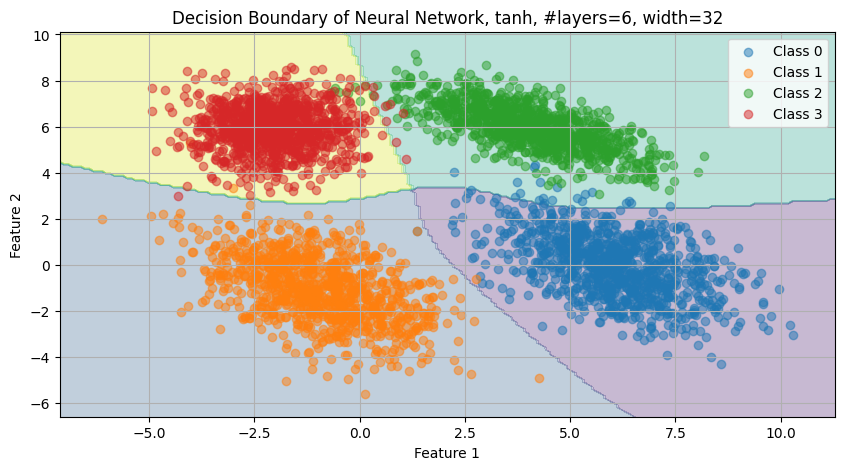

Epoch 1/10, Loss: 0.1421
Epoch 2/10, Loss: 0.0952
Epoch 3/10, Loss: 0.0328
Epoch 4/10, Loss: 0.0621
Epoch 5/10, Loss: 0.0167
Epoch 6/10, Loss: 0.0157
Epoch 7/10, Loss: 0.0190
Epoch 8/10, Loss: 0.0148
Epoch 9/10, Loss: 0.0075
Epoch 10/10, Loss: 0.0595
Training complete.


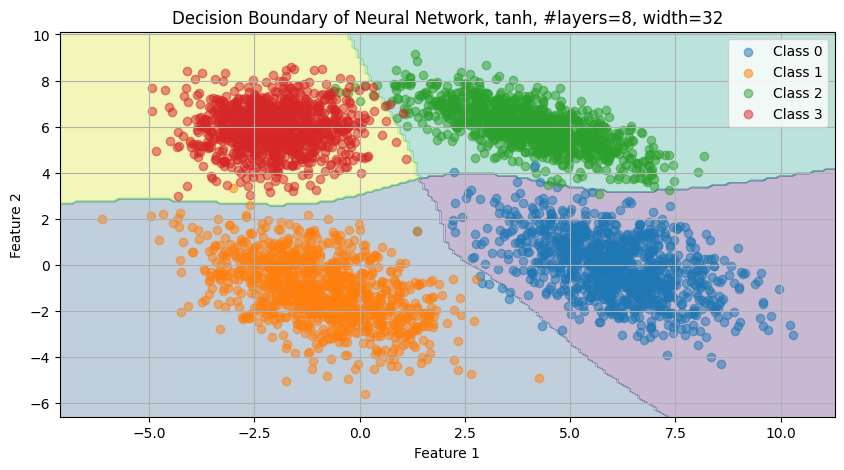

Epoch 1/10, Loss: 0.3370
Epoch 2/10, Loss: 0.1188
Epoch 3/10, Loss: 0.1522
Epoch 4/10, Loss: 0.0439
Epoch 5/10, Loss: 0.0262
Epoch 6/10, Loss: 0.0415
Epoch 7/10, Loss: 0.0220
Epoch 8/10, Loss: 0.0342
Epoch 9/10, Loss: 0.0288
Epoch 10/10, Loss: 0.0175
Training complete.


<Figure size 1000x500 with 0 Axes>

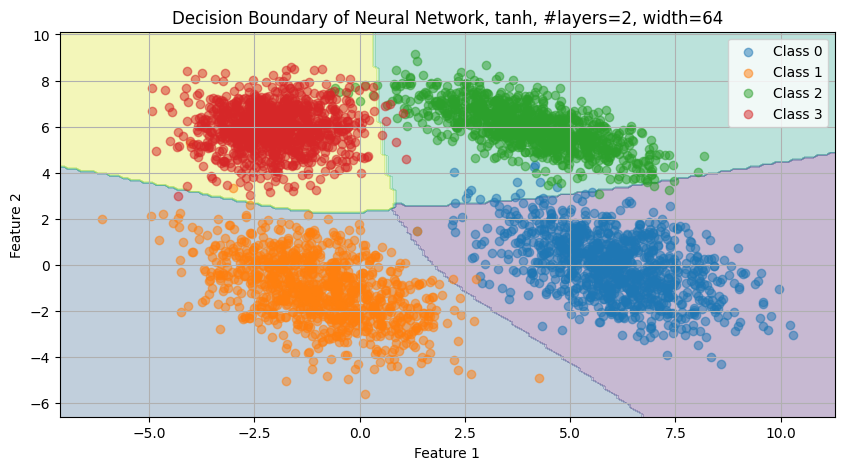

Epoch 1/10, Loss: 0.0334
Epoch 2/10, Loss: 0.0219
Epoch 3/10, Loss: 0.0352
Epoch 4/10, Loss: 0.0172
Epoch 5/10, Loss: 0.0057
Epoch 6/10, Loss: 0.0256
Epoch 7/10, Loss: 0.0020
Epoch 8/10, Loss: 0.0285
Epoch 9/10, Loss: 0.0027
Epoch 10/10, Loss: 0.3110
Training complete.


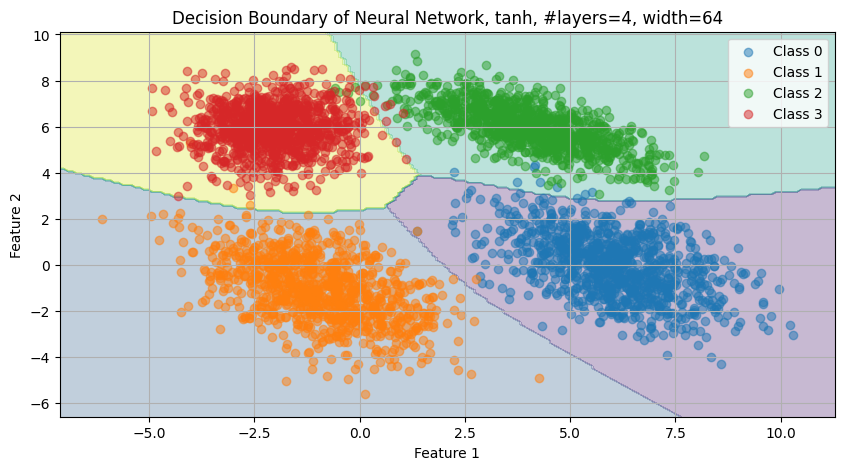

Epoch 1/10, Loss: 0.0307
Epoch 2/10, Loss: 0.0091
Epoch 3/10, Loss: 0.0122
Epoch 4/10, Loss: 0.2255
Epoch 5/10, Loss: 0.0057
Epoch 6/10, Loss: 0.0054
Epoch 7/10, Loss: 0.0069
Epoch 8/10, Loss: 0.0097
Epoch 9/10, Loss: 0.0029
Epoch 10/10, Loss: 0.0021
Training complete.


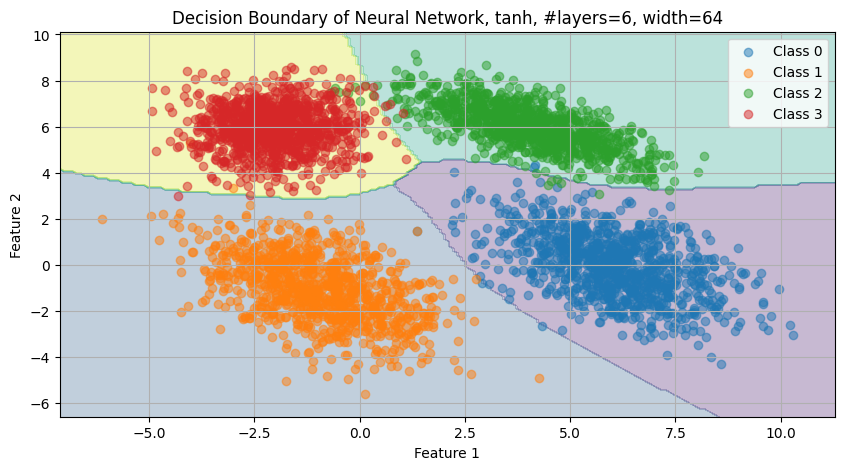

Epoch 1/10, Loss: 0.1443
Epoch 2/10, Loss: 0.0220
Epoch 3/10, Loss: 0.0112
Epoch 4/10, Loss: 0.0051
Epoch 5/10, Loss: 0.0195
Epoch 6/10, Loss: 0.0108
Epoch 7/10, Loss: 0.0524
Epoch 8/10, Loss: 0.0224
Epoch 9/10, Loss: 0.0103
Epoch 10/10, Loss: 0.0252
Training complete.


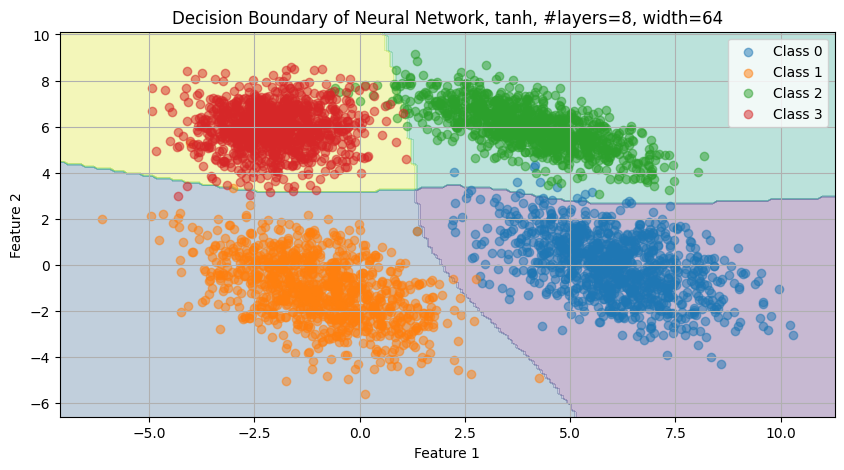

Epoch 1/10, Loss: 0.1331
Epoch 2/10, Loss: 0.0505
Epoch 3/10, Loss: 0.0382
Epoch 4/10, Loss: 0.1292
Epoch 5/10, Loss: 0.0984
Epoch 6/10, Loss: 0.1516
Epoch 7/10, Loss: 0.0442
Epoch 8/10, Loss: 0.0057
Epoch 9/10, Loss: 0.0168
Epoch 10/10, Loss: 0.0067
Training complete.


<Figure size 1000x500 with 0 Axes>

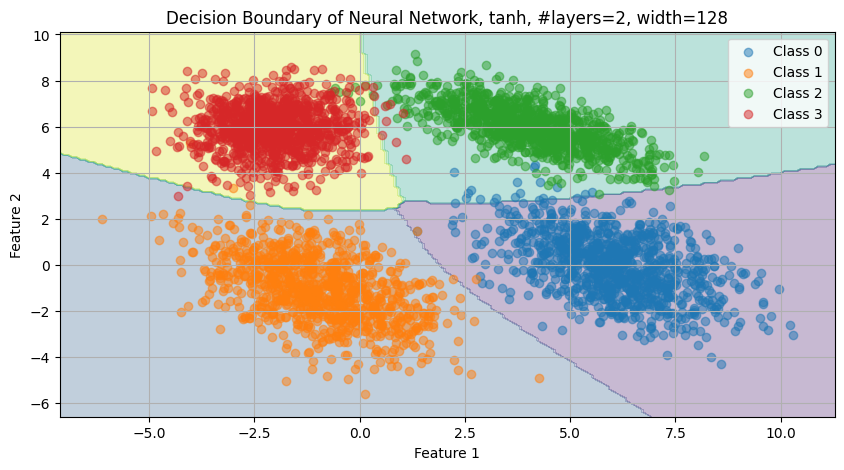

Epoch 1/10, Loss: 0.0078
Epoch 2/10, Loss: 0.0379
Epoch 3/10, Loss: 0.0418
Epoch 4/10, Loss: 0.0079
Epoch 5/10, Loss: 0.0457
Epoch 6/10, Loss: 0.0148
Epoch 7/10, Loss: 0.0408
Epoch 8/10, Loss: 0.0017
Epoch 9/10, Loss: 0.0014
Epoch 10/10, Loss: 0.0010
Training complete.


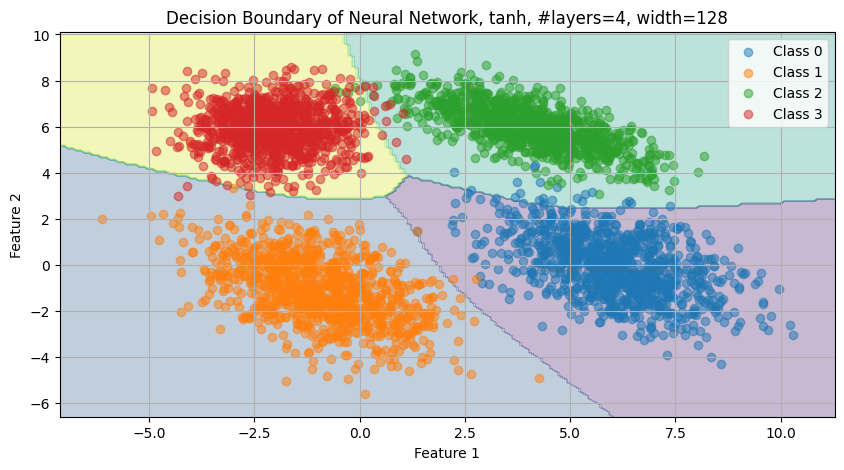

Epoch 1/10, Loss: 0.0188
Epoch 2/10, Loss: 0.2701
Epoch 3/10, Loss: 0.0344
Epoch 4/10, Loss: 0.0769
Epoch 5/10, Loss: 0.0020
Epoch 6/10, Loss: 0.0016
Epoch 7/10, Loss: 0.1107
Epoch 8/10, Loss: 0.0090
Epoch 9/10, Loss: 0.0161
Epoch 10/10, Loss: 0.1869
Training complete.


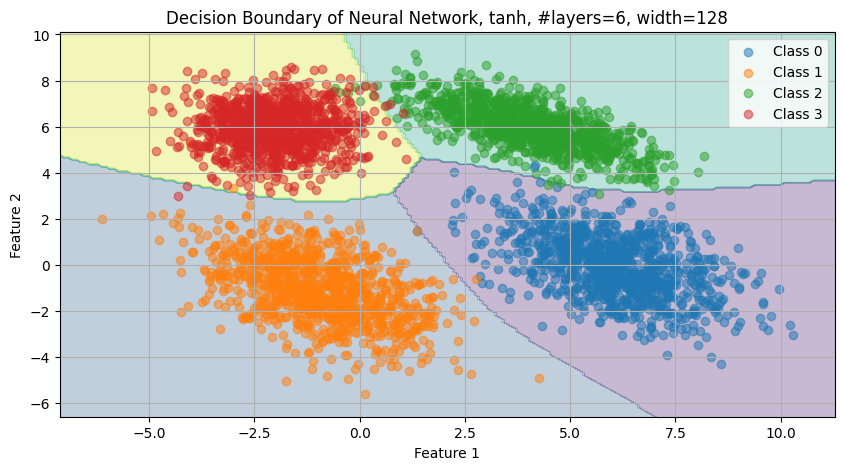

Epoch 1/10, Loss: 0.2036
Epoch 2/10, Loss: 0.0084
Epoch 3/10, Loss: 0.0243
Epoch 4/10, Loss: 0.0017
Epoch 5/10, Loss: 0.0199
Epoch 6/10, Loss: 0.0039
Epoch 7/10, Loss: 0.3132
Epoch 8/10, Loss: 0.0031
Epoch 9/10, Loss: 0.0834
Epoch 10/10, Loss: 0.2091
Training complete.


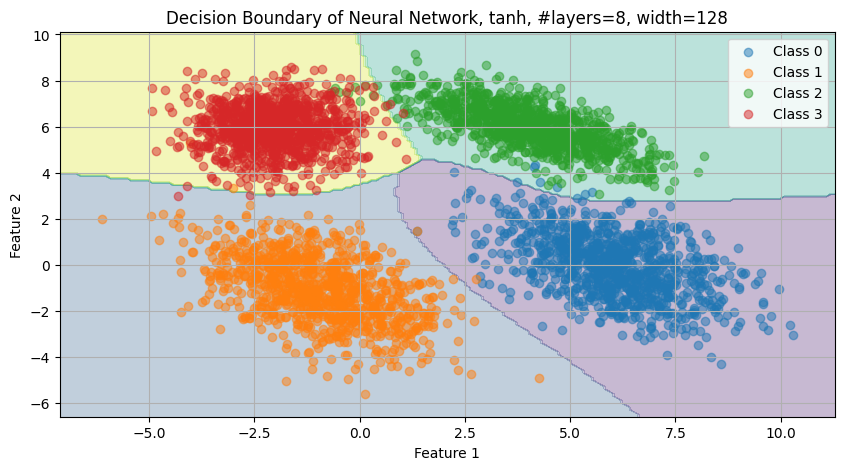

Epoch 1/10, Loss: 0.1152
Epoch 2/10, Loss: 0.0272
Epoch 3/10, Loss: 0.0563
Epoch 4/10, Loss: 0.0490
Epoch 5/10, Loss: 0.0309
Epoch 6/10, Loss: 0.0028
Epoch 7/10, Loss: 0.0319
Epoch 8/10, Loss: 0.2015
Epoch 9/10, Loss: 0.0110
Epoch 10/10, Loss: 0.0727
Training complete.


<Figure size 1000x500 with 0 Axes>

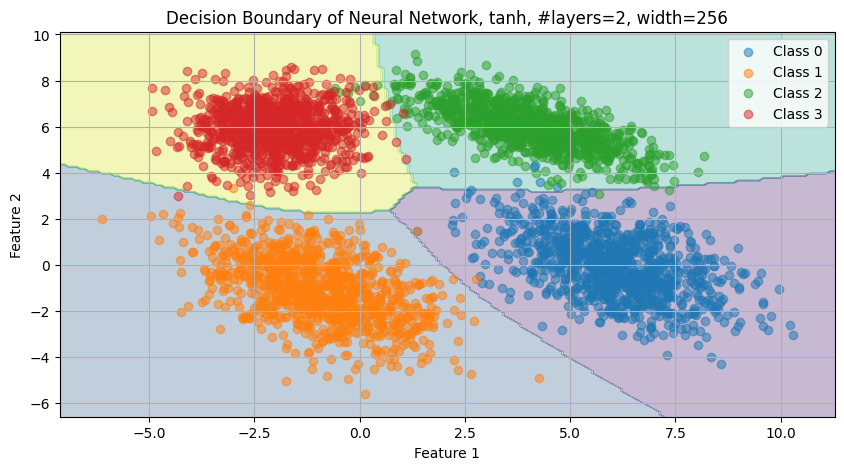

Epoch 1/10, Loss: 0.0407
Epoch 2/10, Loss: 0.0461
Epoch 3/10, Loss: 0.0047
Epoch 4/10, Loss: 0.0011
Epoch 5/10, Loss: 0.0079
Epoch 6/10, Loss: 0.0025
Epoch 7/10, Loss: 0.0006
Epoch 8/10, Loss: 0.0141
Epoch 9/10, Loss: 0.0006
Epoch 10/10, Loss: 0.0025
Training complete.


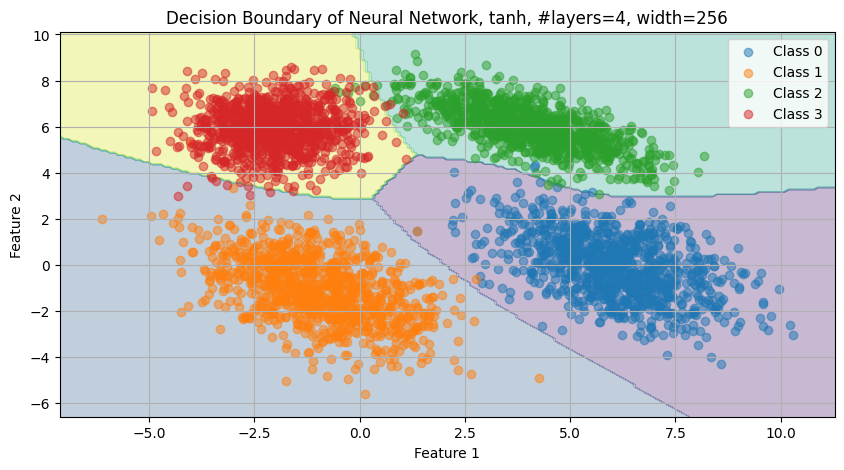

Epoch 1/10, Loss: 0.0429
Epoch 2/10, Loss: 0.0058
Epoch 3/10, Loss: 0.0300
Epoch 4/10, Loss: 0.0861
Epoch 5/10, Loss: 0.0642
Epoch 6/10, Loss: 0.0063
Epoch 7/10, Loss: 0.0021
Epoch 8/10, Loss: 0.0013
Epoch 9/10, Loss: 0.1251
Epoch 10/10, Loss: 0.0022
Training complete.


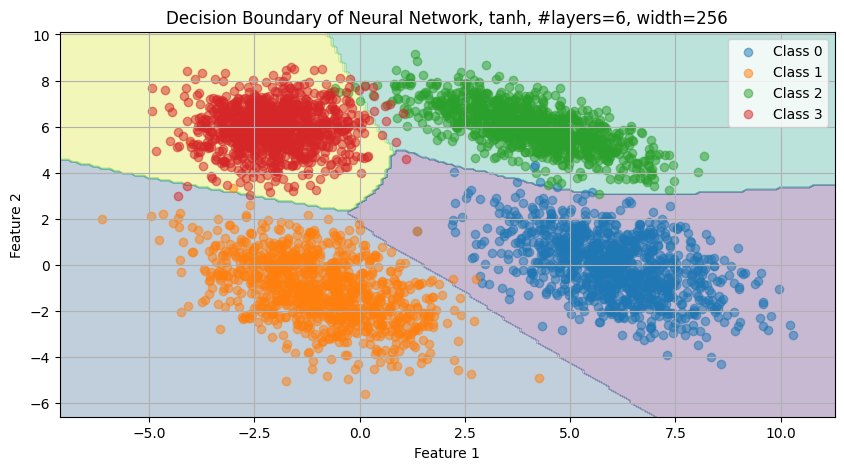

Epoch 1/10, Loss: 0.0038
Epoch 2/10, Loss: 0.0198
Epoch 3/10, Loss: 0.0040
Epoch 4/10, Loss: 0.1281
Epoch 5/10, Loss: 0.0025
Epoch 6/10, Loss: 0.0033
Epoch 7/10, Loss: 0.1043
Epoch 8/10, Loss: 0.0169
Epoch 9/10, Loss: 0.0400
Epoch 10/10, Loss: 0.0101
Training complete.


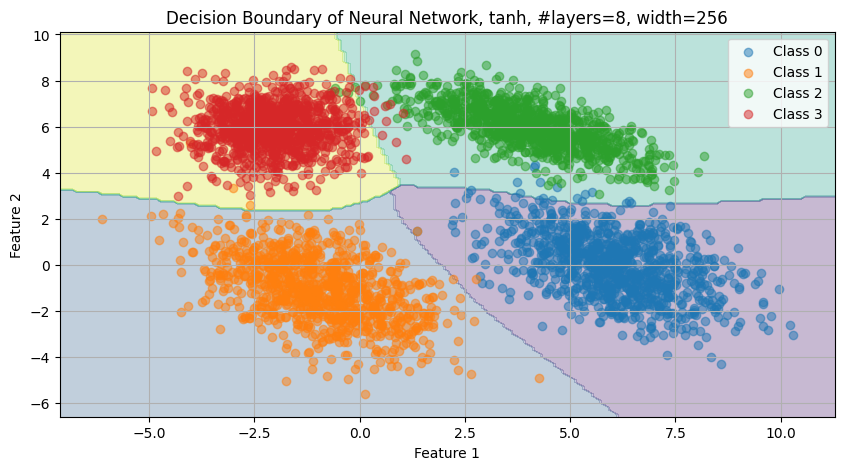

Epoch 1/10, Loss: 0.2064
Epoch 2/10, Loss: 0.0823
Epoch 3/10, Loss: 0.0499
Epoch 4/10, Loss: 0.0353
Epoch 5/10, Loss: 0.1352
Epoch 6/10, Loss: 0.0249
Epoch 7/10, Loss: 0.0088
Epoch 8/10, Loss: 0.0116
Epoch 9/10, Loss: 0.0219
Epoch 10/10, Loss: 0.0076
Training complete.


<Figure size 1000x500 with 0 Axes>

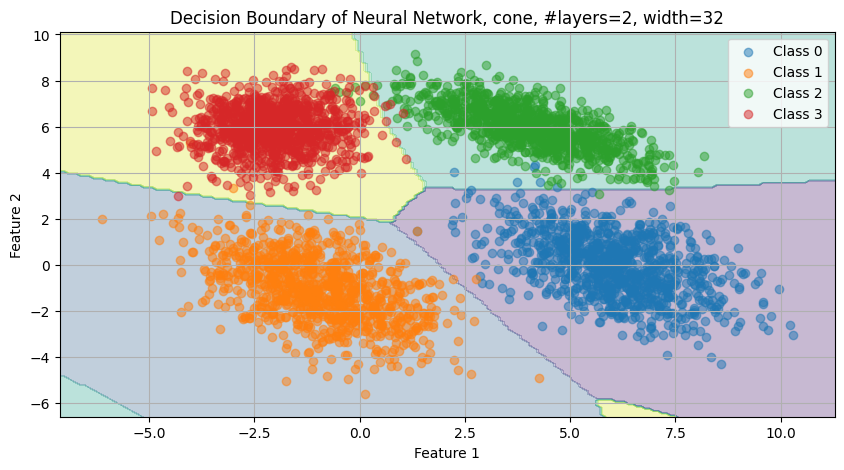

Epoch 1/10, Loss: 0.0297
Epoch 2/10, Loss: 0.0078
Epoch 3/10, Loss: 0.0176
Epoch 4/10, Loss: 0.0143
Epoch 5/10, Loss: 0.0096
Epoch 6/10, Loss: 0.0489
Epoch 7/10, Loss: 0.0028
Epoch 8/10, Loss: 0.0695
Epoch 9/10, Loss: 0.0102
Epoch 10/10, Loss: 0.0190
Training complete.


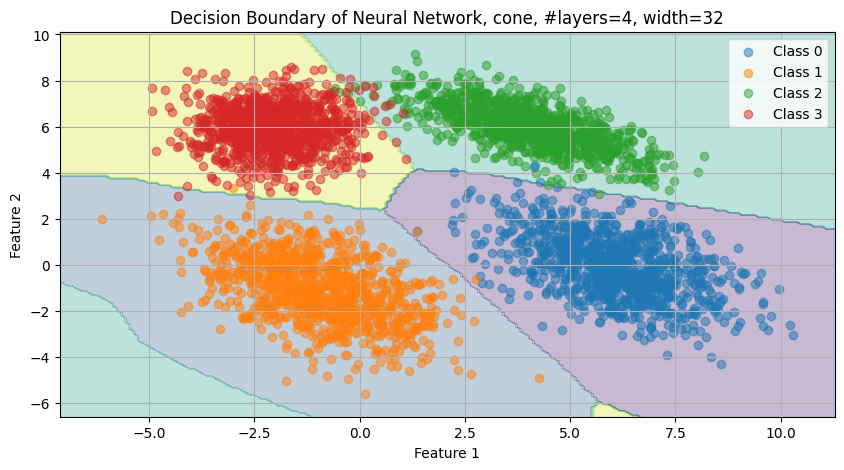

Epoch 1/10, Loss: 0.0274
Epoch 2/10, Loss: 0.0831
Epoch 3/10, Loss: 0.0612
Epoch 4/10, Loss: 0.0021
Epoch 5/10, Loss: 0.3076
Epoch 6/10, Loss: 0.0020
Epoch 7/10, Loss: 0.0032
Epoch 8/10, Loss: 0.0040
Epoch 9/10, Loss: 0.0096
Epoch 10/10, Loss: 0.1145
Training complete.


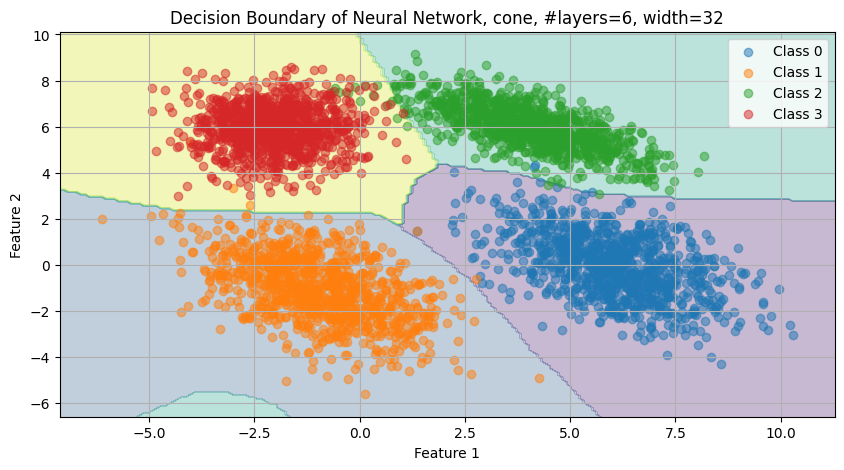

Epoch 1/10, Loss: 0.0363
Epoch 2/10, Loss: 0.0413
Epoch 3/10, Loss: 0.0101
Epoch 4/10, Loss: 0.0039
Epoch 5/10, Loss: 0.0036
Epoch 6/10, Loss: 0.0014
Epoch 7/10, Loss: 0.0410
Epoch 8/10, Loss: 0.0045
Epoch 9/10, Loss: 0.0351
Epoch 10/10, Loss: 0.0009
Training complete.


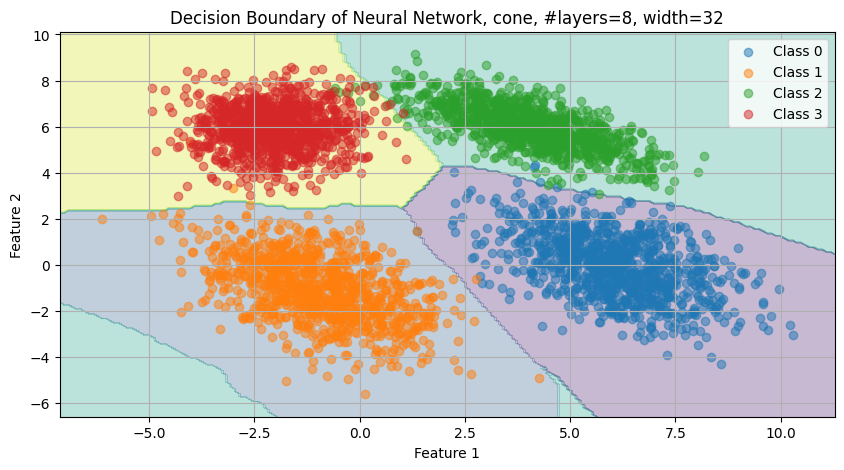

Epoch 1/10, Loss: 0.1882
Epoch 2/10, Loss: 0.0350
Epoch 3/10, Loss: 0.0994
Epoch 4/10, Loss: 0.0258
Epoch 5/10, Loss: 0.0267
Epoch 6/10, Loss: 0.0116
Epoch 7/10, Loss: 0.0116
Epoch 8/10, Loss: 0.0136
Epoch 9/10, Loss: 0.0317
Epoch 10/10, Loss: 0.0250
Training complete.


<Figure size 1000x500 with 0 Axes>

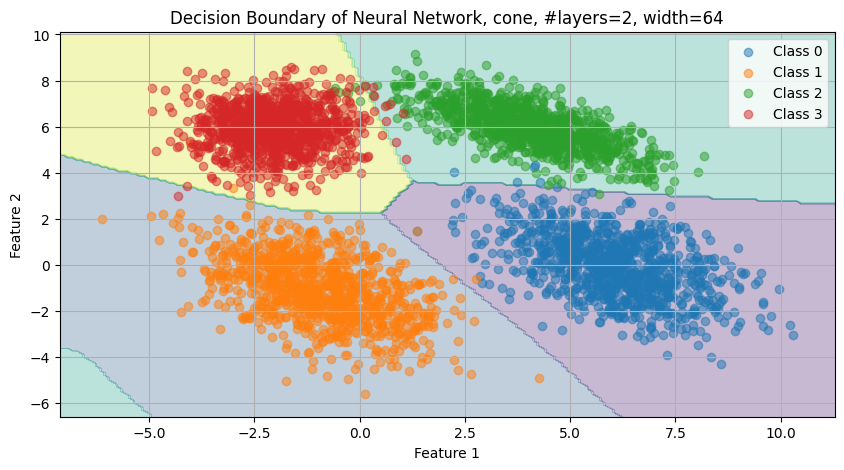

Epoch 1/10, Loss: 0.0114
Epoch 2/10, Loss: 0.0163
Epoch 3/10, Loss: 0.0027
Epoch 4/10, Loss: 0.1257
Epoch 5/10, Loss: 0.0406
Epoch 6/10, Loss: 0.0022
Epoch 7/10, Loss: 0.0066
Epoch 8/10, Loss: 0.0010
Epoch 9/10, Loss: 0.0467
Epoch 10/10, Loss: 0.0021
Training complete.


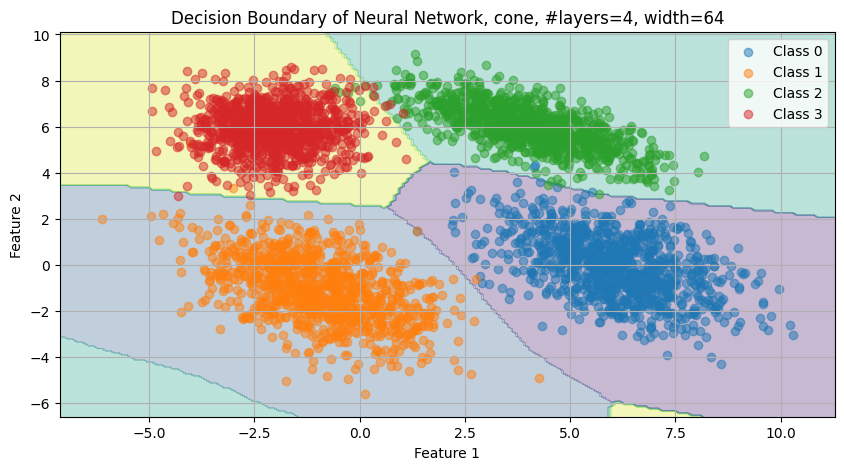

Epoch 1/10, Loss: 0.0070
Epoch 2/10, Loss: 0.0071
Epoch 3/10, Loss: 0.0049
Epoch 4/10, Loss: 0.0108
Epoch 5/10, Loss: 0.0013
Epoch 6/10, Loss: 0.0721
Epoch 7/10, Loss: 0.0018
Epoch 8/10, Loss: 0.0209
Epoch 9/10, Loss: 0.0019
Epoch 10/10, Loss: 0.0117
Training complete.


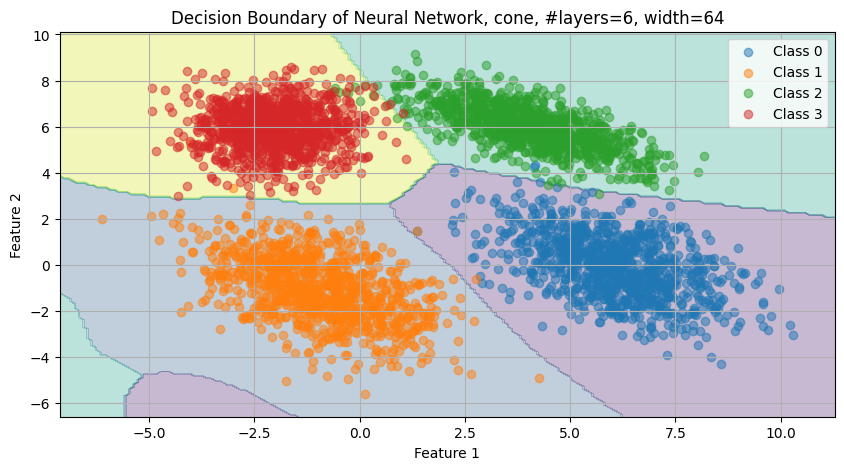

Epoch 1/10, Loss: 0.0172
Epoch 2/10, Loss: 0.0025
Epoch 3/10, Loss: 0.0066
Epoch 4/10, Loss: 0.0022
Epoch 5/10, Loss: 0.0177
Epoch 6/10, Loss: 0.0014
Epoch 7/10, Loss: 0.0012
Epoch 8/10, Loss: 0.0012
Epoch 9/10, Loss: 0.0020
Epoch 10/10, Loss: 0.0022
Training complete.


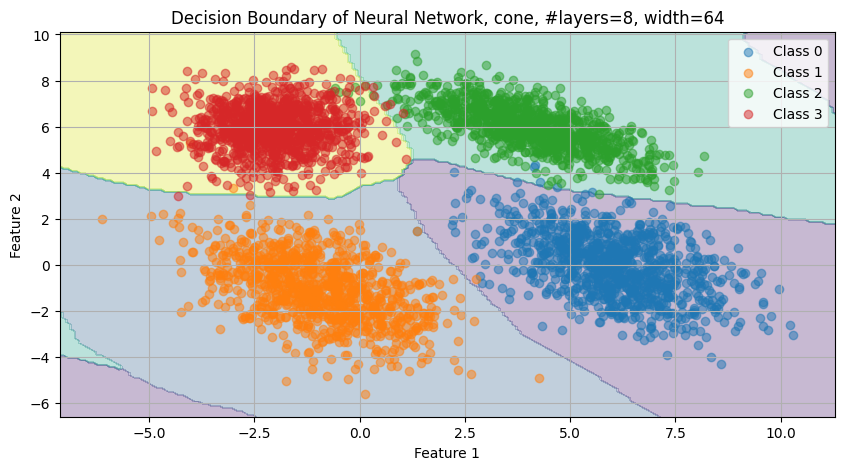

Epoch 1/10, Loss: 0.0763
Epoch 2/10, Loss: 0.0388
Epoch 3/10, Loss: 0.0210
Epoch 4/10, Loss: 0.0277
Epoch 5/10, Loss: 0.0127
Epoch 6/10, Loss: 0.0020
Epoch 7/10, Loss: 0.0061
Epoch 8/10, Loss: 0.0038
Epoch 9/10, Loss: 0.0022
Epoch 10/10, Loss: 0.0138
Training complete.


<Figure size 1000x500 with 0 Axes>

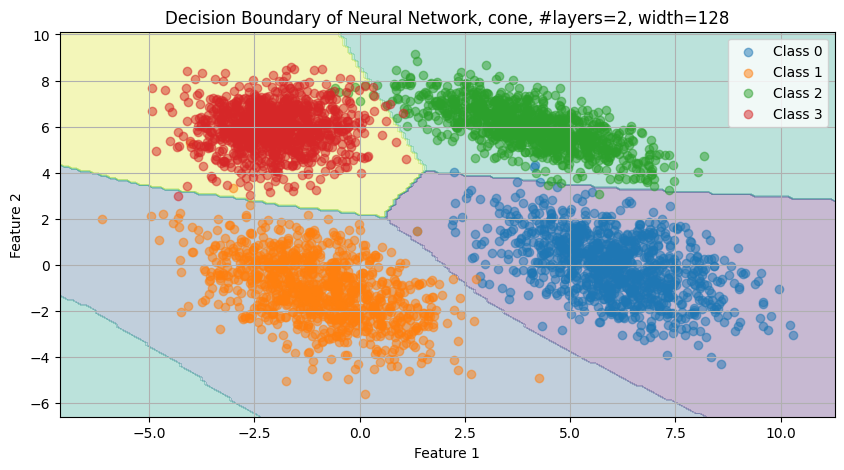

Epoch 1/10, Loss: 0.0271
Epoch 2/10, Loss: 0.0042
Epoch 3/10, Loss: 0.0101
Epoch 4/10, Loss: 0.0161
Epoch 5/10, Loss: 0.0010
Epoch 6/10, Loss: 0.0010
Epoch 7/10, Loss: 0.2176
Epoch 8/10, Loss: 0.0006
Epoch 9/10, Loss: 0.0625
Epoch 10/10, Loss: 0.0300
Training complete.


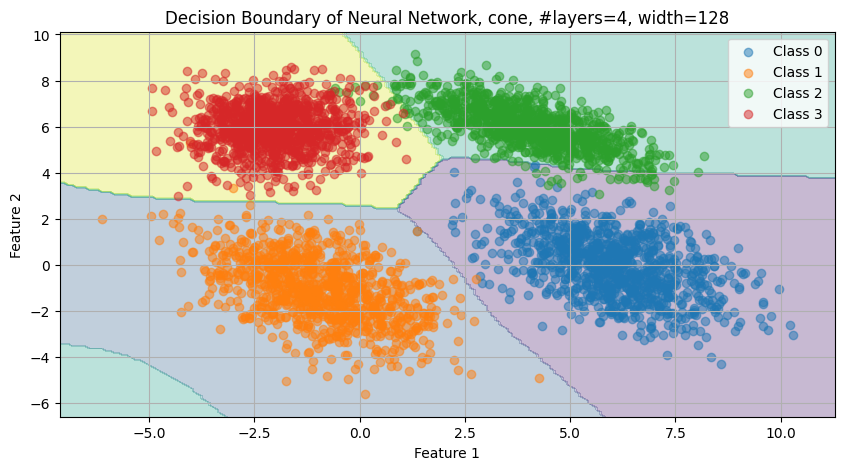

Epoch 1/10, Loss: 0.0242
Epoch 2/10, Loss: 0.1154
Epoch 3/10, Loss: 0.0023
Epoch 4/10, Loss: 0.1392
Epoch 5/10, Loss: 0.0065
Epoch 6/10, Loss: 0.0007
Epoch 7/10, Loss: 0.3178
Epoch 8/10, Loss: 0.0025
Epoch 9/10, Loss: 0.1759
Epoch 10/10, Loss: 0.0004
Training complete.


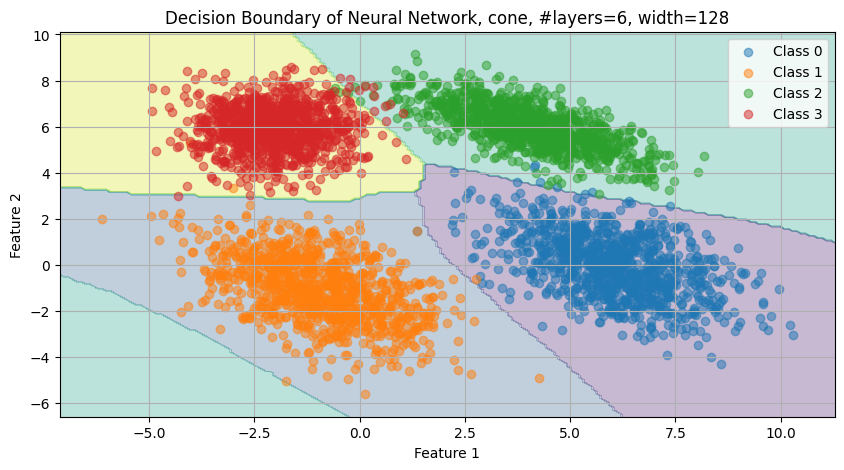

Epoch 1/10, Loss: 0.0064
Epoch 2/10, Loss: 0.0933
Epoch 3/10, Loss: 0.0214
Epoch 4/10, Loss: 0.0610
Epoch 5/10, Loss: 0.0038
Epoch 6/10, Loss: 0.0016
Epoch 7/10, Loss: 0.0019
Epoch 8/10, Loss: 0.0021
Epoch 9/10, Loss: 0.0005
Epoch 10/10, Loss: 0.0141
Training complete.


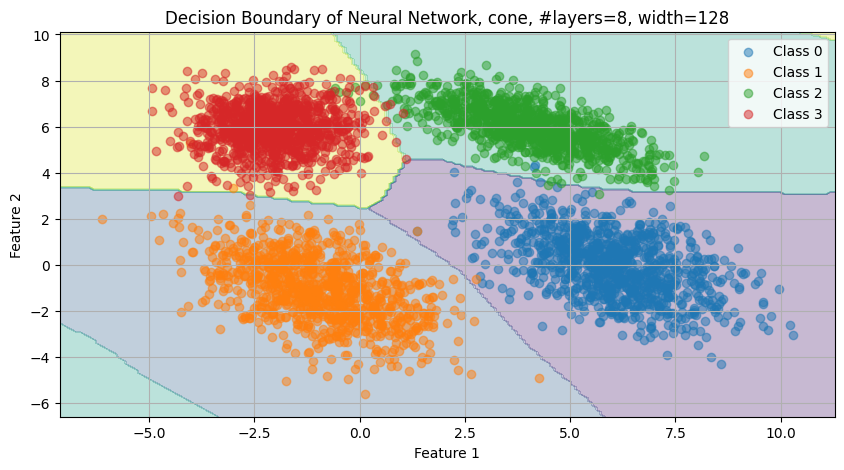

Epoch 1/10, Loss: 0.0438
Epoch 2/10, Loss: 0.0120
Epoch 3/10, Loss: 0.0067
Epoch 4/10, Loss: 0.0018
Epoch 5/10, Loss: 0.0951
Epoch 6/10, Loss: 0.0097
Epoch 7/10, Loss: 0.0032
Epoch 8/10, Loss: 0.0012
Epoch 9/10, Loss: 0.0091
Epoch 10/10, Loss: 0.0088
Training complete.


<Figure size 1000x500 with 0 Axes>

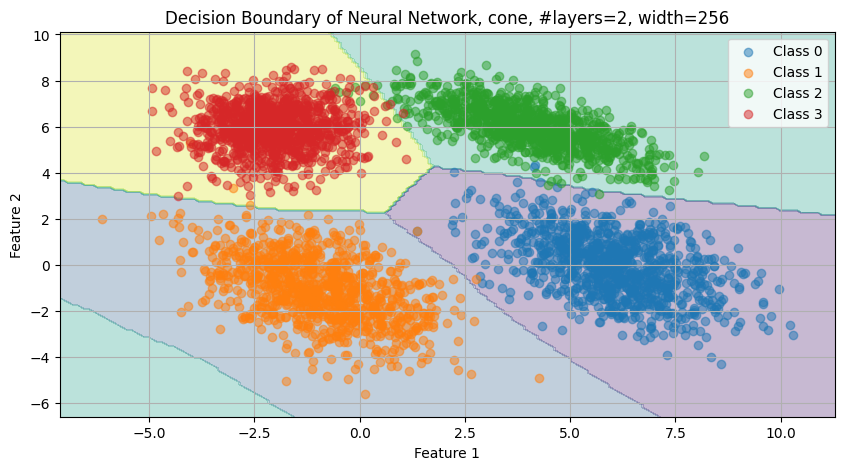

Epoch 1/10, Loss: 0.0783
Epoch 2/10, Loss: 0.0829
Epoch 3/10, Loss: 0.0003
Epoch 4/10, Loss: 0.0188
Epoch 5/10, Loss: 0.1681
Epoch 6/10, Loss: 0.0146
Epoch 7/10, Loss: 0.0512
Epoch 8/10, Loss: 0.0009
Epoch 9/10, Loss: 0.0164
Epoch 10/10, Loss: 0.0004
Training complete.


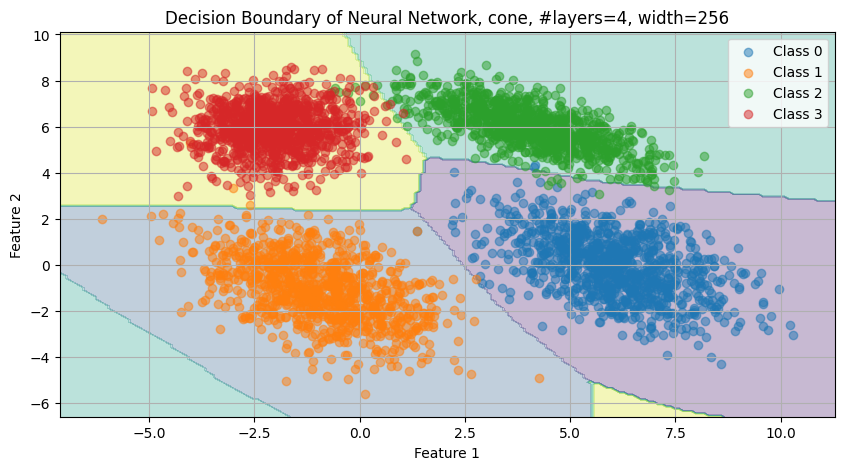

Epoch 1/10, Loss: 0.0017
Epoch 2/10, Loss: 0.0382
Epoch 3/10, Loss: 0.0015
Epoch 4/10, Loss: 0.0175
Epoch 5/10, Loss: 0.0015
Epoch 6/10, Loss: 0.0896
Epoch 7/10, Loss: 0.0007
Epoch 8/10, Loss: 0.0005
Epoch 9/10, Loss: 0.0039
Epoch 10/10, Loss: 0.0182
Training complete.


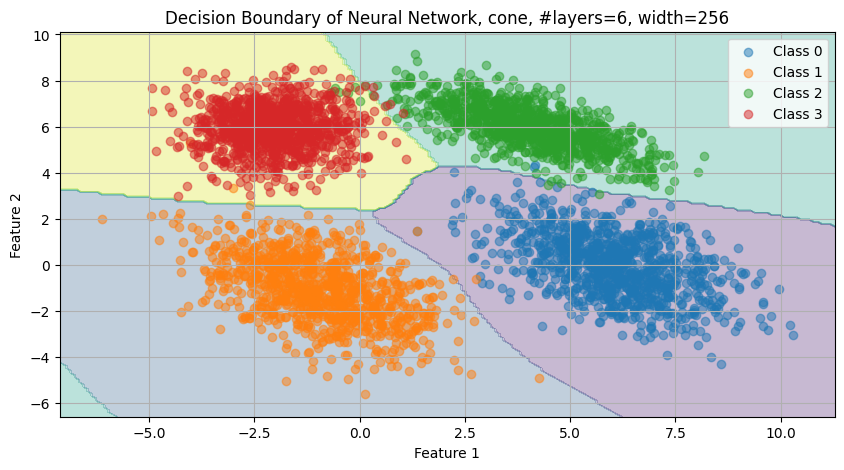

Epoch 1/10, Loss: 0.0008
Epoch 2/10, Loss: 0.0098
Epoch 3/10, Loss: 0.0011
Epoch 4/10, Loss: 0.0022
Epoch 5/10, Loss: 0.0053
Epoch 6/10, Loss: 0.0561
Epoch 7/10, Loss: 0.0059
Epoch 8/10, Loss: 0.0460
Epoch 9/10, Loss: 0.0024
Epoch 10/10, Loss: 0.0178
Training complete.


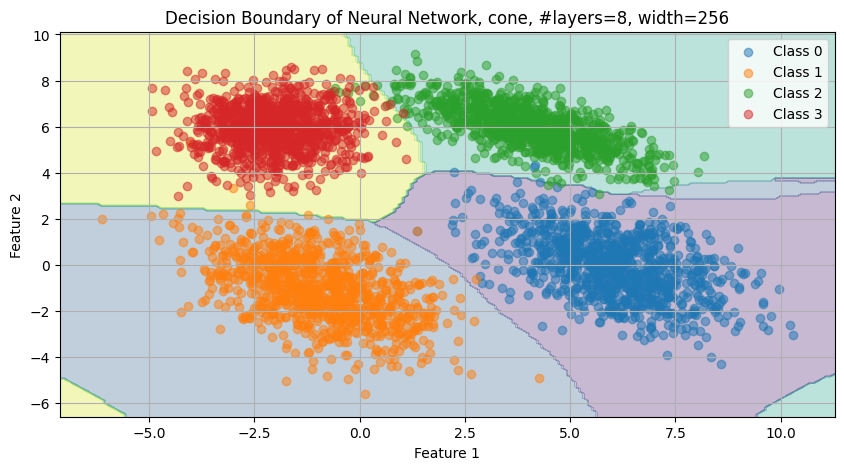

In [48]:
activs = ['relu', 'tanh', 'cone'] 

num_layers = [2,4,6,8]
hidden_widths = [32,64,128,256] #[32,64,128,256]

criterion = nn.CrossEntropyLoss() # Use cross-entropy loss

num_epochs = 10 # Define number of epochs to train


for activ in activs:
    for hidden_width in hidden_widths:
        
        # Plot the loss over iterations
        plt.figure(figsize=(10, 5))
        for num_layer in num_layers:
        
            model2 = SimpleNN2(activ, num_layer, hidden_width)
            
            optimizer = optim.Adam(model2.parameters(), lr=0.001) # Use Adam optimizer
            
            

            
            losses = []
            #             losses_test = []
            for epoch in range(num_epochs):
                for inputs, targets in dataloader_train: # the dataloader defines size of mini-batch (here 32)
                    # Zero the parameter gradients
                    optimizer.zero_grad()
                    # Forward pass
                    outputs = model2(inputs) # model prediction of the outputs
                    loss = criterion(outputs, targets) # calculate the loss over the mini-batch
                    # Backward pass and optimization
                    loss.backward() # the infamous backpropagation
                    optimizer.step() # update the parameters in your model based on backpropaged gradients, i.e. x_k+1 = x_k - eta * grad f(x_k)
                    # Record the loss
                    losses.append(loss.item())

                print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}')
            print('Training complete.')

        

#             # Call the function to plot the decision boundary
            plot_decision_boundary(model2, data_train_tensor, labels_train_tensor, title_info=f'{activ}, #layers={num_layer}, width={hidden_width}')

## G Alternative datasets

In [113]:
# Set random seed for reproducibility
np.random.seed(0)
torch.manual_seed(0)

# Generate dataset
num_train_samples = 1000

# Class 0: Gaussian centered at (6, 0) + Gaussian centered at (-2, 6)
mean0 = [6, 0]
cov0 = [[2, -1], [-1, 2]]

data0_train = np.random.multivariate_normal(mean0, cov0, num_train_samples)
labels0_train = np.zeros(num_train_samples)

mean3 = [-2, 6]
cov3 = [[1, 0], [0, 1]]

data3_train = np.random.multivariate_normal(mean3, cov3, num_train_samples)
labels3_train = np.zeros(num_train_samples)

# Class 1: Gaussian centered at (-1, -1) + Gaussian centered at (4, 6)
mean1 = [-1, -1]
cov1 = [[2, -1], [-1, 2]]

data1_train = np.random.multivariate_normal(mean1, cov1, num_train_samples)
labels1_train = np.ones(num_train_samples)

mean2 = [4, 6]
cov2 = [[2, -1], [-1, 1]]

data2_train = np.random.multivariate_normal(mean2, cov2, num_train_samples)
labels2_train = np.ones(num_train_samples)

# Combine data
data_train = np.vstack((data0_train, data1_train, data2_train, data3_train))
labels_train = np.hstack((labels0_train, labels1_train, labels2_train, labels3_train))

# Convert to PyTorch tensors
data_train_tensor = torch.tensor(data_train, dtype=torch.float32)
labels_train_tensor = torch.tensor(labels_train, dtype=torch.long)

# Create DataLoader - will be used later for training the NN
dataset_train_binary = TensorDataset(data_train_tensor, labels_train_tensor)
dataloader_train_binary = DataLoader(dataset_train_binary, batch_size=32, shuffle=True) # Mini-batch = 32

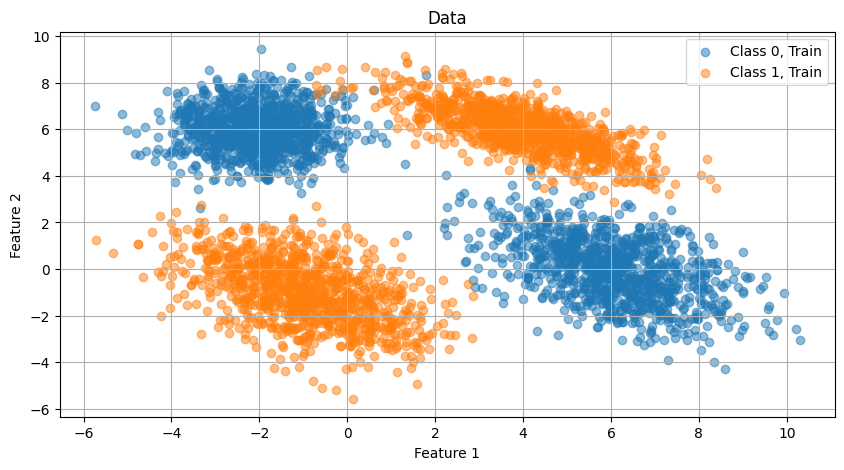

In [114]:
## Plot the data

plt.figure(figsize=(10, 5))
plt.scatter(data_train[labels_train == 0, 0], data_train[labels_train == 0, 1], label='Class 0, Train', alpha=0.5)
plt.scatter(data_train[labels_train == 1, 0], data_train[labels_train == 1, 1], label='Class 1, Train', alpha=0.5)

plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Data')
plt.legend()
plt.grid(True)
plt.show()

In [115]:
# Initialize the neural network, loss function, and optimizer
model = SimpleNN2(num_classes=2, activ='relu', num_layer=3, hidden_width=64)
criterion = nn.CrossEntropyLoss() # Use cross-entropy loss

optimizer = optim.Adam(model.parameters(), lr=0.001) # Use Adam optimizer --> one can use different optimizers too

losses = []
losses_test = []
num_epochs = 10 # Define number of epochs to train
for epoch in range(num_epochs):
    for inputs, targets in dataloader_train_binary: # the dataloader defines size of mini-batch (here 32)
        # Zero the parameter gradients
        optimizer.zero_grad()
        # Forward pass
        outputs = model(inputs) # model prediction of the outputs
        loss = criterion(outputs, targets) # calculate the loss over the mini-batch
        # Backward pass and optimization
        loss.backward() # the infamous backpropagation
        optimizer.step() # update the parameters in your model based on backpropaged gradients, i.e. x_k+1 = x_k - eta * grad f(x_k)
        # Record the loss
        losses.append(loss.item())


    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}')
print('Training complete.')

Epoch 1/10, Loss: 0.0221
Epoch 2/10, Loss: 0.0216
Epoch 3/10, Loss: 0.0053
Epoch 4/10, Loss: 0.0654
Epoch 5/10, Loss: 0.0227
Epoch 6/10, Loss: 0.0034
Epoch 7/10, Loss: 0.0020
Epoch 8/10, Loss: 0.0036
Epoch 9/10, Loss: 0.0091
Epoch 10/10, Loss: 0.0277
Training complete.


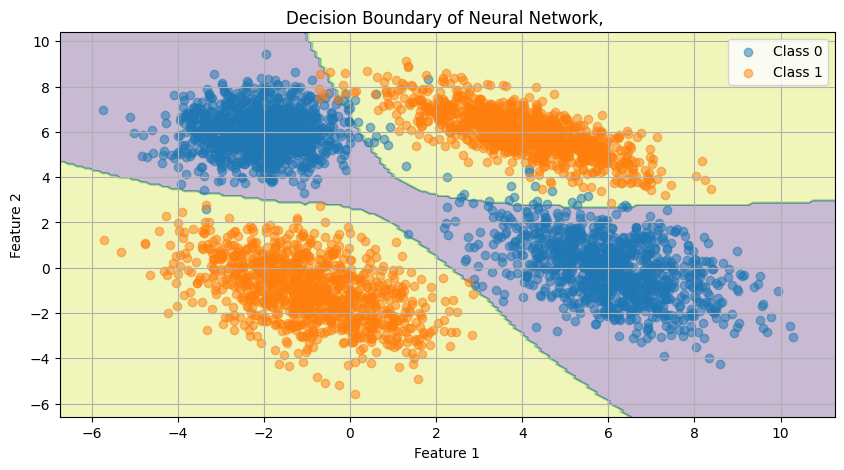

In [116]:
plot_decision_boundary(model, data_train_tensor, labels_train_tensor, title_info='')

In [117]:
# Set random seed for reproducibility
np.random.seed(0)
torch.manual_seed(0)

# Generate dataset
num_train_samples = 1000

# Class 0: Gaussian centered at (0, 0) 
mean0 = [0, 0]
cov0 = [[1, 0], [0, 1]]

data0_train = np.random.multivariate_normal(mean0, cov0, num_train_samples)
labels0_train = np.zeros(num_train_samples)

# parametrize circle:
r = 7
pts = r*np.array([[np.sin(t), np.cos(t)] for t in range(num_train_samples)])

data1_train = np.random.multivariate_normal(mean0, cov0, num_train_samples) + pts
labels1_train = np.ones(num_train_samples)

# Combine data
data_train = np.vstack((data0_train, data1_train))
labels_train = np.hstack((labels0_train, labels1_train))

# Convert to PyTorch tensors
data_train_tensor = torch.tensor(data_train, dtype=torch.float32)
labels_train_tensor = torch.tensor(labels_train, dtype=torch.long)

# Create DataLoader - will be used later for training the NN
dataset_train_binary = TensorDataset(data_train_tensor, labels_train_tensor)
dataloader_train_binary = DataLoader(dataset_train_binary, batch_size=32, shuffle=True) # Mini-batch = 32

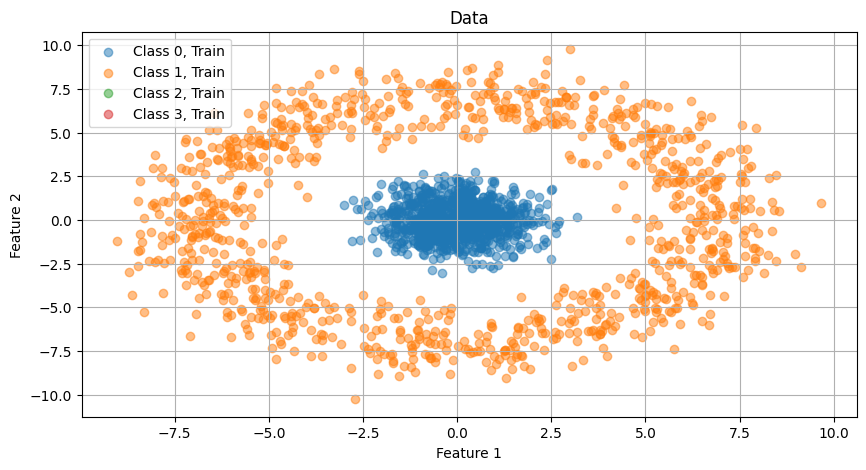

In [118]:
## Plot the data

plt.figure(figsize=(10, 5))
plt.scatter(data_train[labels_train == 0, 0], data_train[labels_train == 0, 1], label='Class 0, Train', alpha=0.5)
plt.scatter(data_train[labels_train == 1, 0], data_train[labels_train == 1, 1], label='Class 1, Train', alpha=0.5)
plt.scatter(data_train[labels_train == 2, 0], data_train[labels_train == 2, 1], label='Class 2, Train', alpha=0.5)
plt.scatter(data_train[labels_train == 3, 0], data_train[labels_train == 3, 1], label='Class 3, Train', alpha=0.5)

plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Data')
plt.legend()
plt.grid(True)
plt.show()

In [119]:
# Initialize the neural network, loss function, and optimizer
model = SimpleNN2(num_classes=2, activ='relu', num_layer=3, hidden_width=64)
criterion = nn.CrossEntropyLoss() # Use cross-entropy loss

optimizer = optim.Adam(model.parameters(), lr=0.001) # Use Adam optimizer --> one can use different optimizers too

losses = []
losses_test = []
num_epochs = 10 # Define number of epochs to train
for epoch in range(num_epochs):
    for inputs, targets in dataloader_train_binary: # the dataloader defines size of mini-batch (here 32)
        # Zero the parameter gradients
        optimizer.zero_grad()
        # Forward pass
        outputs = model(inputs) # model prediction of the outputs
        loss = criterion(outputs, targets) # calculate the loss over the mini-batch
        # Backward pass and optimization
        loss.backward() # the infamous backpropagation
        optimizer.step() # update the parameters in your model based on backpropaged gradients, i.e. x_k+1 = x_k - eta * grad f(x_k)
        # Record the loss
        losses.append(loss.item())


    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}')
print('Training complete.')

Epoch 1/10, Loss: 0.1306
Epoch 2/10, Loss: 0.0179
Epoch 3/10, Loss: 0.0032
Epoch 4/10, Loss: 0.0092
Epoch 5/10, Loss: 0.0013
Epoch 6/10, Loss: 0.0020
Epoch 7/10, Loss: 0.0015
Epoch 8/10, Loss: 0.0006
Epoch 9/10, Loss: 0.0004
Epoch 10/10, Loss: 0.0003
Training complete.


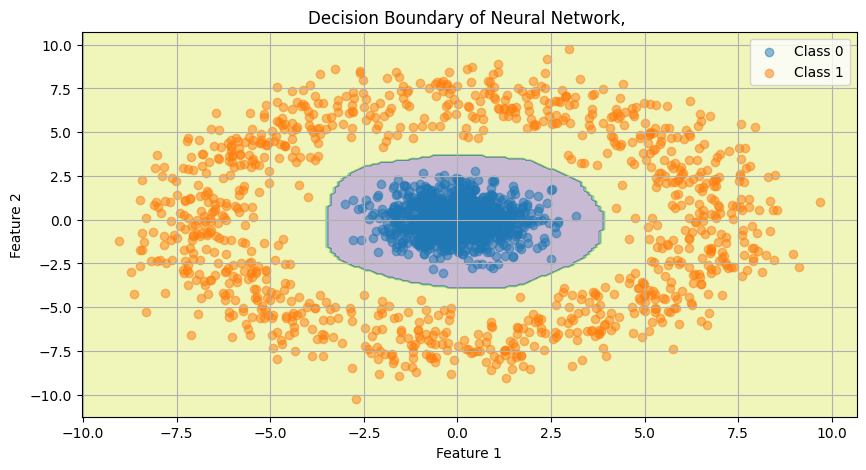

In [120]:
plot_decision_boundary(model, data_train_tensor, labels_train_tensor, title_info='')